count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278


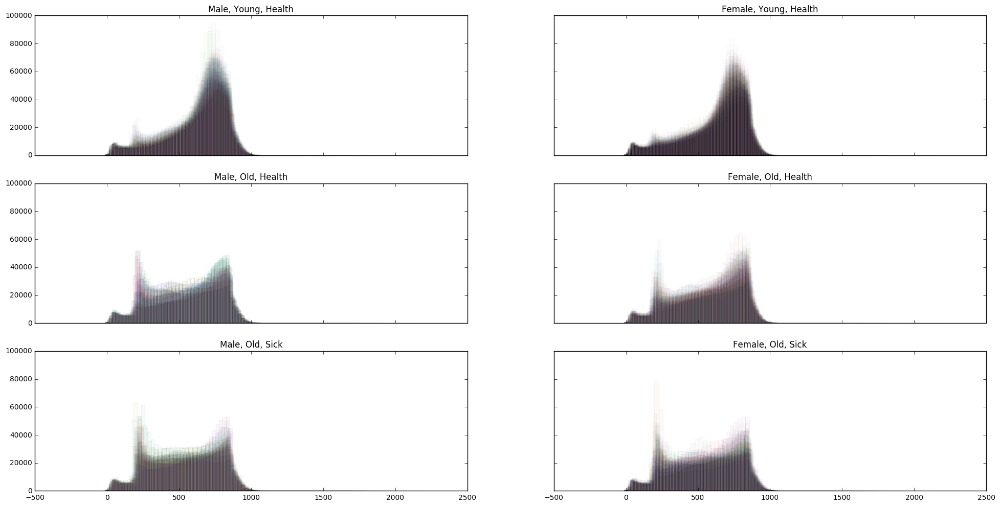

In [1]:
# visualize gray matter histograms
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 24
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True)
axs[0,0].set_title('Male, Young, Health')
axs[0,1].set_title('Female, Young, Health')
axs[1,0].set_title('Male, Old, Health')
axs[1,1].set_title('Female, Old, Health')
axs[2,0].set_title('Male, Old, Sick')
axs[2,1].set_title('Female, Old, Sick')


alpha = [0]*8
for label, c in count.iteritems():
    if label == 888: continue
    alpha[label] = 1.0 / c

bins = 80
for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    # here plot the histogram for this image
    new_size = ndImg.shape[0] * ndImg.shape[1] * ndImg.shape[2]
    imgLst = np.reshape(ndImg, (1, new_size))
    imgLst = imgLst[imgLst <> 0]
    
    if mapped_targets[pic_id] == 0:
        axs[2,0].hist(imgLst, bins = bins, alpha=alpha[0]) # male, old, sick
    if mapped_targets[pic_id] == 1:
        axs[1,0].hist(imgLst, bins = bins, alpha=alpha[1]) # male, old, health
    if mapped_targets[pic_id] == 3:
        axs[0,0].hist(imgLst, bins = bins, alpha=alpha[3]) # male, young, health
    if mapped_targets[pic_id] == 4:
        axs[2,1].hist(imgLst, bins = bins, alpha=alpha[4]) # female, old, sick
    if mapped_targets[pic_id] == 5:
        axs[1,1].hist(imgLst, bins = bins, alpha=alpha[5]) # female, old, health
    if mapped_targets[pic_id] == 7:
        axs[0,1].hist(imgLst, bins = bins, alpha=alpha[7]) # female, young, health    
    gc.collect()
    

plt.show()    

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278


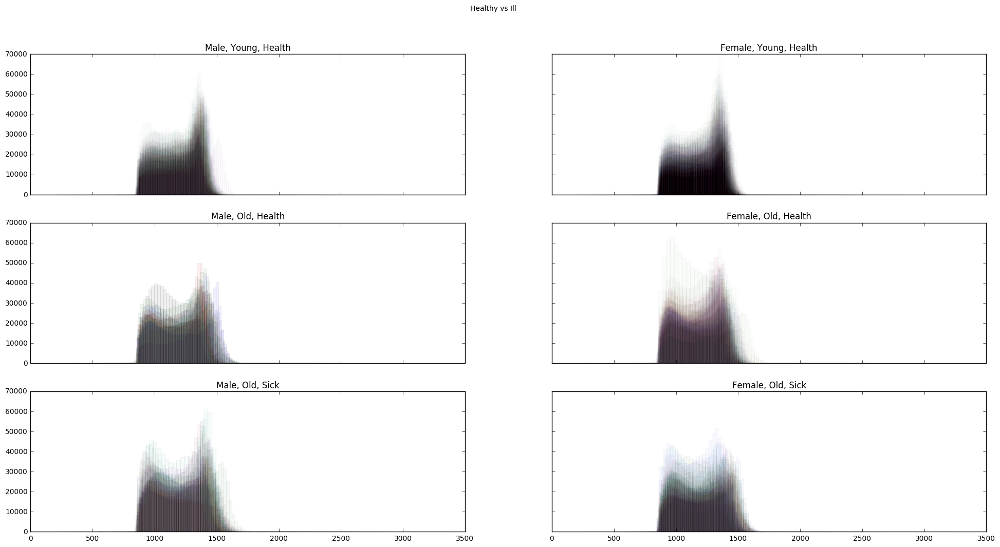

In [9]:
# visualize white matter histograms
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('w_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 24
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True)
axs[0,0].set_title('Male, Young, Health')
axs[0,1].set_title('Female, Young, Health')
axs[1,0].set_title('Male, Old, Health')
axs[1,1].set_title('Female, Old, Health')
axs[2,0].set_title('Male, Old, Sick')
axs[2,1].set_title('Female, Old, Sick')


alpha = [0]*8
for label, c in count.iteritems():
    if label == 888: continue
    alpha[label] = 1.0 / c

bins = 80
for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    # here plot the histogram for this image
    new_size = ndImg.shape[0] * ndImg.shape[1] * ndImg.shape[2]
    imgLst = np.reshape(ndImg, (1, new_size))
    imgLst = imgLst[imgLst <> 0]
    
    if mapped_targets[pic_id] == 0:
        axs[2,0].hist(imgLst, bins = bins, alpha=alpha[0]) # male, old, sick
    if mapped_targets[pic_id] == 1:
        axs[1,0].hist(imgLst, bins = bins, alpha=alpha[1]) # male, old, health
    if mapped_targets[pic_id] == 3:
        axs[0,0].hist(imgLst, bins = bins, alpha=alpha[3]) # male, young, health
    if mapped_targets[pic_id] == 4:
        axs[2,1].hist(imgLst, bins = bins, alpha=alpha[4]) # female, old, sick
    if mapped_targets[pic_id] == 5:
        axs[1,1].hist(imgLst, bins = bins, alpha=alpha[5]) # female, old, health
    if mapped_targets[pic_id] == 7:
        axs[0,1].hist(imgLst, bins = bins, alpha=alpha[7]) # female, young, health    
    gc.collect()
    


plt.show()    

#print 'Healthy std:  ', int(np.sqrt(np.sum(h_std)))
#print 'Ill std:      ', int(np.sqrt(np.sum(i_std)))

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278


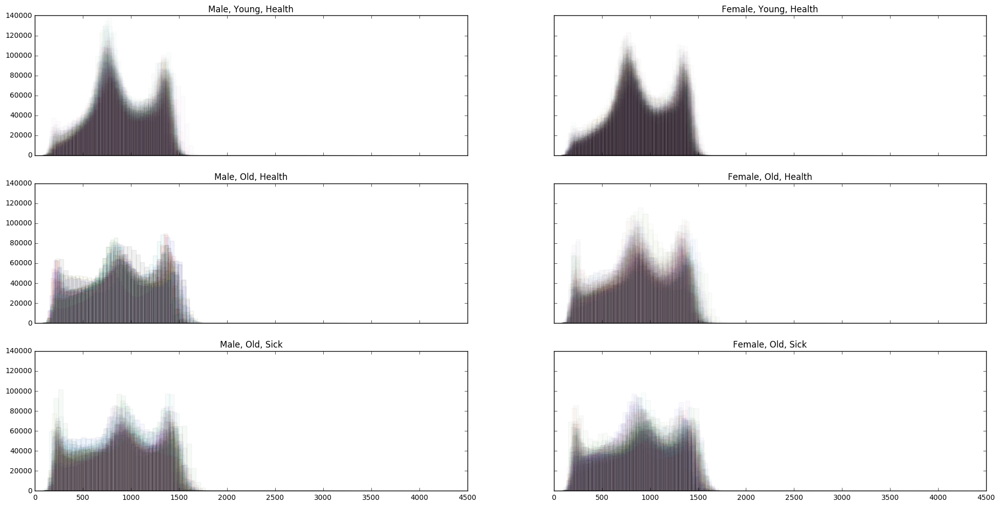

In [4]:
# visualize whole img histograms
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 24
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True)
axs[0,0].set_title('Male, Young, Health')
axs[0,1].set_title('Female, Young, Health')
axs[1,0].set_title('Male, Old, Health')
axs[1,1].set_title('Female, Old, Health')
axs[2,0].set_title('Male, Old, Sick')
axs[2,1].set_title('Female, Old, Sick')


alpha = [0]*8
for label, c in count.iteritems():
    if label == 888: continue
    alpha[label] = 1.0 / c

bins = 80
for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = nib.load(full_f).get_data()
    ndImg = np.sum(ndImg, axis=3)       # sum upon the 4th axis so that we reduce the img to 3d
    pic_id = int(f.split('_')[1].split('.')[0])
    
    # here plot the histogram for this image
    new_size = ndImg.shape[0] * ndImg.shape[1] * ndImg.shape[2]
    imgLst = np.reshape(ndImg, (1, new_size))
    imgLst = imgLst[imgLst <> 0]
    
    if mapped_targets[pic_id] == 0:
        axs[2,0].hist(imgLst, bins = bins, alpha=alpha[0]) # male, old, sick
    if mapped_targets[pic_id] == 1:
        axs[1,0].hist(imgLst, bins = bins, alpha=alpha[1]) # male, old, health
    if mapped_targets[pic_id] == 3:
        axs[0,0].hist(imgLst, bins = bins, alpha=alpha[3]) # male, young, health
    if mapped_targets[pic_id] == 4:
        axs[2,1].hist(imgLst, bins = bins, alpha=alpha[4]) # female, old, sick
    if mapped_targets[pic_id] == 5:
        axs[1,1].hist(imgLst, bins = bins, alpha=alpha[5]) # female, old, health
    if mapped_targets[pic_id] == 7:
        axs[0,1].hist(imgLst, bins = bins, alpha=alpha[7]) # female, young, health    
    gc.collect()
    


plt.show()    

#print 'Healthy std:  ', int(np.sqrt(np.sum(h_std)))
#print 'Ill std:      ', int(np.sqrt(np.sum(i_std)))

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278


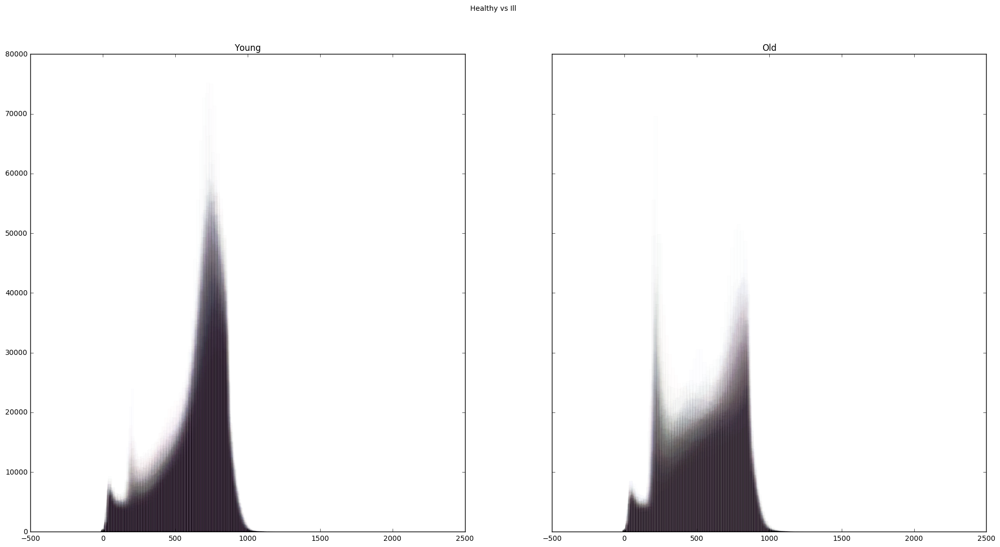

In [10]:
# separate young from old based on gray matter
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 24
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)
axs[0].set_title('Young')
axs[1].set_title('Old')


for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    # here plot the histogram for this image
    new_size = ndImg.shape[0] * ndImg.shape[1] * ndImg.shape[2]
    imgLst = np.reshape(ndImg, (1, new_size))
    imgLst = imgLst[imgLst <> 0]
    
    if mapped_targets[pic_id] % 4 < 2:
        axs[1].hist(imgLst, bins = 100, alpha=1.0/137.0) # old
    if mapped_targets[pic_id] % 4 >= 2:
        axs[0].hist(imgLst, bins = 100, alpha=1.0/145.0) # young  
    gc.collect()
    

plt.show()    

In [46]:
# calculate the ratio of size of white and gray matter to separade the gender
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles_g = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles_w = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('w_')]
onlyfiles_g.sort()
onlyfiles_w.sort()
onlyfiles = onlyfiles[:160]
length = len(onlyfiles_g)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 24
fig_size[1] = 12
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)
axs[0].set_title('Young')
axs[1].set_title('Old')

ratio_male = []
ratio_fem = []
for it, (w,g) in enumerate(zip(onlyfiles_w, onlyfiles_g)):
    if it % 20 == 0:
        print it,'/',length
    full_f_w = join(test_path, w)
    full_f_g = join(test_path, g)
    ndImg_w = np.load(full_f_w)
    ndImg_g = np.load(full_f_g)
    pic_id_w = int(w.split('_')[2].split('.')[0])
    pic_id_g = int(g.split('_')[2].split('.')[0])
    
    if pic_id_w <> pic_id_g:
        print 'Fucking error in pic id: ', pic_id_w, ' ', pic_id_g
    
    # here plot the histogram for this image
    new_size = ndImg_w.shape[0] * ndImg_w.shape[1] * ndImg_w.shape[2]
    imgLst_w = np.reshape(ndImg_w, (1, new_size))
    imgLst_g = np.reshape(ndImg_g, (1, new_size))
    white_size = np.count_nonzero(imgLst_w)
    gray_size = np.count_nonzero(imgLst_g)
    
    ratio = float(white_size) / float(gray_size)
    
    if mapped_targets[pic_id_w] % 4 < 2:
        continue         # skip old
    
    if mapped_targets[pic_id_w] < 4:
        ratio_male.append(ratio) 
    if mapped_targets[pic_id_w] >= 4:
        ratio_fem.append(ratio) 
    gc.collect()
    


print 'male: ', np.mean(ratio_male)  
print 'fem: ', np.mean(ratio_fem)  
print 'std male: ', np.std(ratio_male)  
print 'std fem: ', np.std(ratio_fem) 

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
20 / 278
40 / 278
60 / 278
80 / 278
100 / 278
120 / 278
140 / 278
160 / 278
180 / 278
200 / 278
220 / 278
240 / 278
260 / 278
male:  0.845539530053
fem:  0.922675635709
std male:  0.0546486865588
std fem:  0.0556376695008


count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278


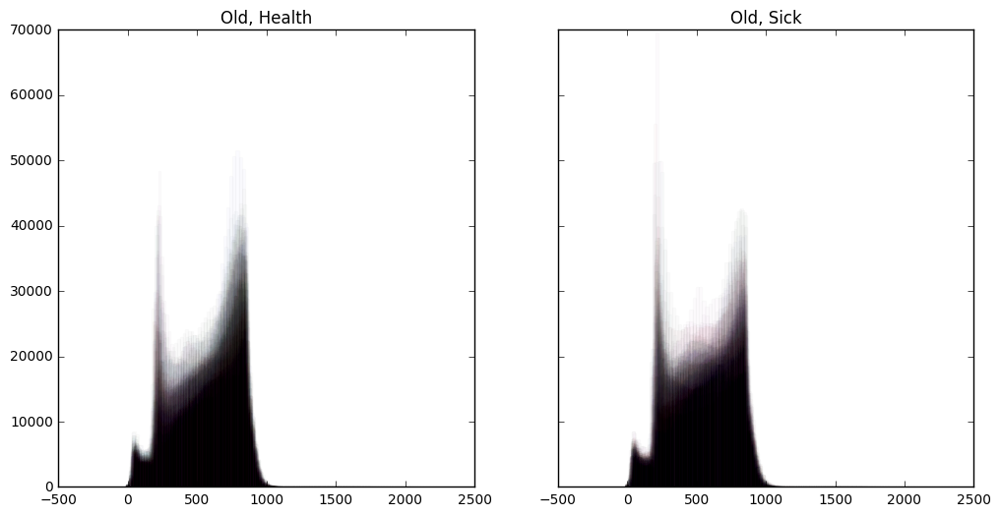

In [12]:
# separate health status of old people
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 9
fig_size[1] = 6
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)
axs[0].set_title('Old, Health')
axs[1].set_title('Old, Sick')

for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    # here plot the histogram for this image
    new_size = ndImg.shape[0] * ndImg.shape[1] * ndImg.shape[2]
    imgLst = np.reshape(ndImg, (1, new_size))
    imgLst = imgLst[imgLst <> 0]
    
    if mapped_targets[pic_id] % 4 >= 2: # young 
        continue
    if mapped_targets[pic_id] == 1:
        axs[0].hist(imgLst, bins = 100, alpha=1.0/66.0) # male, health
    if mapped_targets[pic_id] == 5:
        axs[0].hist(imgLst, bins = 100, alpha=1.0/66.0) # female, health
        
        
    if mapped_targets[pic_id] == 0:
        axs[1].hist(imgLst, bins = 100, alpha=1.0/67.0) # male, old, sick
    if mapped_targets[pic_id] == 4:
        axs[1].hist(imgLst, bins = 100, alpha=1.0/67.0) # female, old, sick
    gc.collect()
    

plt.show()    

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278
gray size male mean: 860723.108696
gray size male std: 28145.5593611
gray size female mean: 859090.344828
gray size female std: 26025.7670157


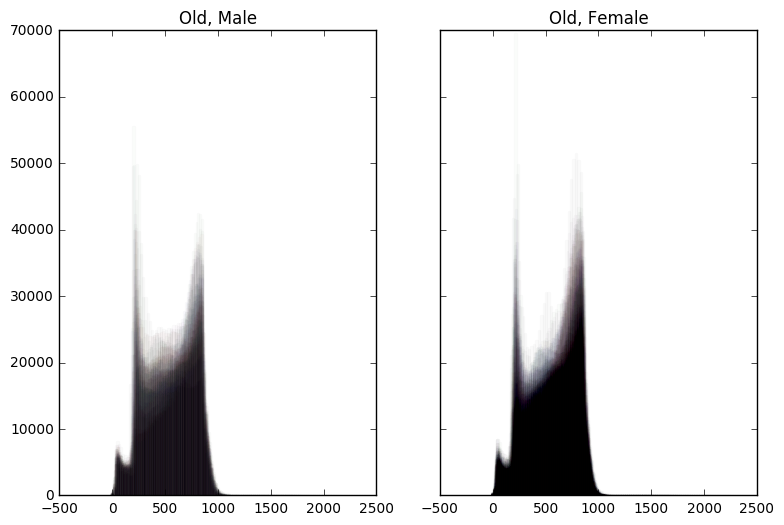

In [3]:
# separate gender of old people
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 9
fig_size[1] = 6
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True)
axs[0].set_title('Old, Male')
axs[1].set_title('Old, Female')

gray_size_male = []
gray_size_female = []
for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    # here plot the histogram for this image
    new_size = ndImg.shape[0] * ndImg.shape[1] * ndImg.shape[2]
    imgLst = np.reshape(ndImg, (1, new_size))
    imgLst = imgLst[imgLst <> 0]
    
    if mapped_targets[pic_id] % 4 >= 2: # young 
        continue
    if mapped_targets[pic_id] == 1:
        gray_size_male.append(np.count_nonzero(imgLst))
        axs[0].hist(imgLst, bins = 100, alpha=1.0/66.0) # male, health
    if mapped_targets[pic_id] == 5:
        gray_size_female.append(np.count_nonzero(imgLst))
        axs[1].hist(imgLst, bins = 100, alpha=1.0/66.0) # female, health
        
        
    if mapped_targets[pic_id] == 0:
        gray_size_male.append(np.count_nonzero(imgLst))
        axs[0].hist(imgLst, bins = 100, alpha=1.0/67.0) # male, old, sick
    if mapped_targets[pic_id] == 4:
        gray_size_female.append(np.count_nonzero(imgLst))
        axs[1].hist(imgLst, bins = 100, alpha=1.0/67.0) # female, old, sick
    gc.collect()
    
print 'gray size male mean:', np.mean(gray_size_male)
print 'gray size male std:', np.std(gray_size_male)
print 'gray size female mean:', np.mean(gray_size_female)
print 'gray size female std:', np.std(gray_size_female)
plt.show()    

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278
50 / 278
100 / 278
150 / 278
200 / 278
250 / 278


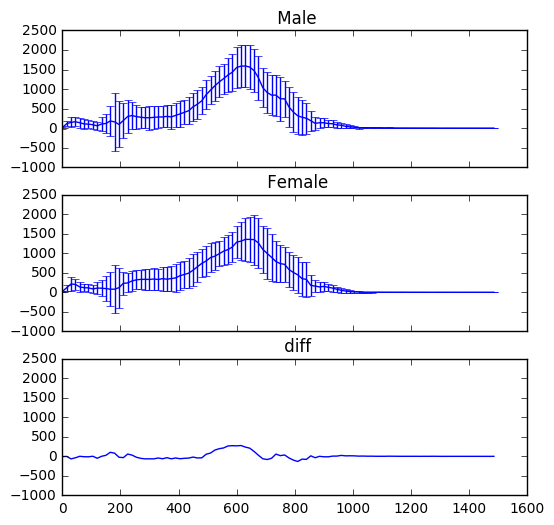

In [57]:
# separate gender of old people
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter

mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 6
fig_size[1] = 6
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True)
axs[0].set_title(' Male')
axs[1].set_title(' Female')
axs[2].set_title(' diff')


bins = 100
ave_male = []
ave_fem = []
for i,f in enumerate(onlyfiles):
    if i % 50 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    imgLeft = ndImg[0:88,:,:]
    imgRight = ndImg[89:,:,:]
    #print 'left size: ', imgLeft.shape
    #print 'right size: ', imgRight.shape
    
    imgLeft = imgLeft[imgLeft <> 0]
    imgRight = imgRight[imgRight <> 0]
    xL, bin_edges = np.histogram(imgLeft, bins=bins, range=(0, 1500))
    xR, bin_edges = np.histogram(imgRight, bins=bins, range=(0, 1500))
    
    x = np.subtract(xL, xR)
    
    
    # here plot the histogram for this image
    
    if mapped_targets[pic_id] % 4 < 2: # skip old 
        continue
    if mapped_targets[pic_id] < 4:   #male
        ave_male.append(x)
    if mapped_targets[pic_id] >= 4:  #female
        ave_fem.append(x)
        

    gc.collect()
    
std_male = np.std(ave_male, axis=0)
std_fem = np.std(ave_fem, axis=0)    
ave_male = np.mean(ave_male, axis=0)
ave_fem = np.mean(ave_fem, axis=0)
diff = np.subtract(ave_male, ave_fem)


x_ax = bin_edges[:-1]
axs[0].errorbar(x_ax, ave_male, std_male)


axs[1].errorbar(x_ax, ave_fem, std_fem)

axs[2].plot(x_ax, diff)
plt.show()    

count:  Counter({7: 83, 3: 62, 5: 48, 4: 39, 0: 28, 1: 18, 888: 1})
Files found: in /home/igor/ML/data_3/set_train_segmented/  278
0 / 278


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:14: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


30 / 278
60 / 278
90 / 278
120 / 278
150 / 278
180 / 278
210 / 278
240 / 278
270 / 278


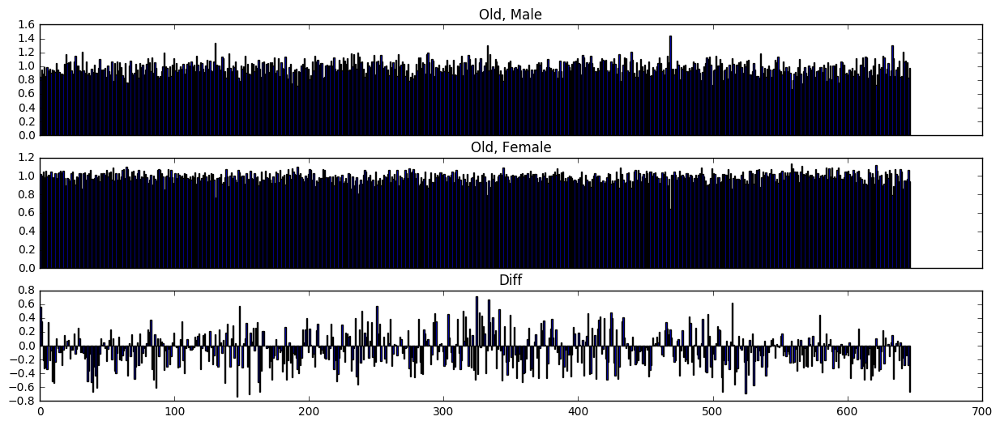

In [31]:
# separate gender of old people BUT with structure
from __future__ import division
import os
import numpy as np
import gc
import nibabel as nib
import matplotlib.pyplot as plt
from os.path import isfile, join
from collections import Counter


def smooth_img(img, vSize):
    if vSize > 1:
        imgCUT = np.zeros((img.shape[0]/vSize, img.shape[1]/vSize, img.shape[2]/vSize))
        #print 'imgCUT shape: ', imgCUT.shape
        for i in range(0, img.shape[0], vSize):
            for j in range(0, img.shape[1], vSize):
                for k in range(0, img.shape[2], vSize):
                    result = np.sum(img[i:i+vSize, j:j+vSize, k:k+vSize])
                    #result = np.count_nonzero(img[i:i+vSize, j:j+vSize, k:k+vSize])
                    #print 'result: ', i/vSize, j/vSize, k/vSize
                    imgCUT[i/vSize][j/vSize][k/vSize] = result

    elif vSize == 1:
        img[img <> 0] = 1 
        imgCUT = img              

    new_size = imgCUT.shape[0] * imgCUT.shape[1] * imgCUT.shape[2]
    x = np.reshape(imgCUT, (1, new_size))

    if np.min(x) == 0 and np.max(x) == 0:
        print 'Error in smoothing: result are all zeros!!!!'
    return x[0]


mode = 'train'
test_path = '/home/igor/ML/data_3/set_'+mode+'_segmented/'

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')

targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


count = Counter(mapped_targets)
print 'count: ', count


onlyfiles = [f for f in os.listdir(test_path) if isfile(join(test_path, f)) \
             and f.endswith('.nii.npy') and f.startswith('g_')]
onlyfiles.sort()
#onlyfiles = onlyfiles[:160]
length = len(onlyfiles)

print 'Files found: in '+test_path+' ', length

plt.close()
fig_size = plt.rcParams["figure.figsize"]
# Set figure width and height
fig_size[0] = 15
fig_size[1] = 6
plt.rcParams["figure.figsize"] = fig_size  

fig, axs = plt.subplots(nrows=3, ncols=1, sharex=True)
axs[0].set_title('Old, Male')
axs[1].set_title('Old, Female')
axs[2].set_title('Diff')

X = []
y = []
for i,f in enumerate(onlyfiles):
    if i % 30 == 0:
        print i,'/',length
    full_f = join(test_path, f)
    ndImg = np.load(full_f)
    pic_id = int(f.split('_')[2].split('.')[0])
    
    if mapped_targets[pic_id] % 4 >= 2: # young 
        continue
    if mapped_targets[pic_id] == 1:
        y.append(0) # male, health
    if mapped_targets[pic_id] == 5:
        y.append(1) # female, health
        
        
    if mapped_targets[pic_id] == 0:
        y.append(0) # male, old, sick
    if mapped_targets[pic_id] == 4:
        y.append(1) # female, old, sick
        
    vSize = 16
    x = smooth_img(ndImg, vSize)
    X.append(x)   
        
    gc.collect()

    
from sklearn.feature_selection import VarianceThreshold  
from sklearn import preprocessing, decomposition
variance_threshold = VarianceThreshold(threshold=.1) 
scaler = preprocessing.StandardScaler()
X = variance_threshold.fit_transform(X)
X = scaler.fit_transform(X)
    
male_ave = []
female_ave = []
for i, x in enumerate(X):
    if y[i] == 0:
        male_ave.append(x)
    else:
        female_ave.append(x)
        

male_std = np.std(male_ave, axis=0) 
female_std = np.std(female_ave, axis=0)        
male_ave = np.mean(male_ave, axis=0) 
female_ave = np.mean(female_ave, axis=0) 
diff_ave = np.subtract(male_ave, female_ave)
ind = np.arange(len(male_ave))
axs[0].bar(ind, male_std)
axs[1].bar(ind, female_std)
axs[2].bar(ind, diff_ave)
plt.show()    

[[ -7.96894165e+00  -2.79664228e+00]
 [ -8.90002234e+00   7.62402079e+00]
 [  1.26570116e+01  -1.07100615e+01]
 [ -6.47923050e+00  -1.71471498e+00]
 [  2.65667440e+00   1.54376988e+01]
 [  4.20119360e+00  -2.12775368e+00]
 [ -1.58254869e+01  -3.32915737e+00]
 [ -2.83751712e+00   1.24184851e+01]
 [ -1.91176171e+01  -8.46083525e+00]
 [  1.34106406e+01   2.82173082e+00]
 [ -6.73745328e+00   2.02591362e+01]
 [ -1.01870761e+01  -4.00698701e+00]
 [  9.34472437e-01  -7.84245439e+00]
 [  1.45063718e+01   1.01105229e+01]
 [  1.03793165e+01  -4.28188727e-01]
 [  7.01540904e+00  -1.29832047e+01]
 [ -4.60851652e+00  -9.44564972e+00]
 [  4.31463053e+00  -4.21829038e+00]
 [ -2.42227874e+00  -1.10773506e+01]
 [  2.73254055e+00  -5.48013723e-01]
 [ -1.30855665e+01   7.88928235e+00]
 [ -2.07652608e+00  -3.44594500e+00]
 [ -6.80067152e-01   7.94705731e-01]
 [ -1.76397151e+00  -6.29968347e+00]
 [ -1.29016813e+00  -5.31031473e+00]
 [  9.41880952e+00   7.90158657e+00]
 [  1.32022497e+01  -5.67113494e+00]
 

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:14: VisibleDeprecationWarning: using a boolean instead of an integer will result in an error in the future


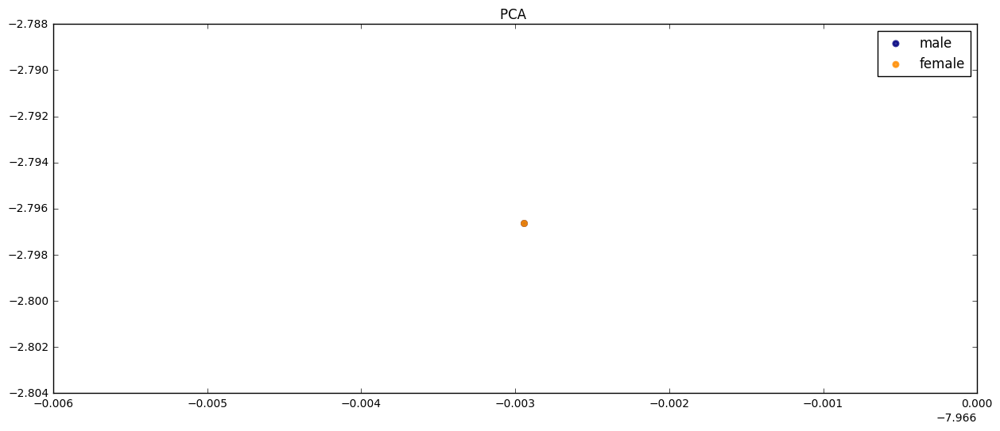

In [35]:
from sklearn.decomposition import PCA
target_names = ['male', 'female']

pca = PCA(n_components=2)
X_r = pca.fit(X).transform(X)

print X_r

plt.figure()
colors = ['navy', 'darkorange']
lw = 2

for color, i, target_name in zip(colors, [0, 1 ], target_names):
    plt.scatter(X_r[y == i, 0], X_r[y == i, 1], color=color, alpha=.8, lw=lw,
                label=target_name)
plt.legend(loc='best', shadow=False, scatterpoints=1)
plt.title('PCA ')

plt.show()

size onlyfiles:  278
 female, health 


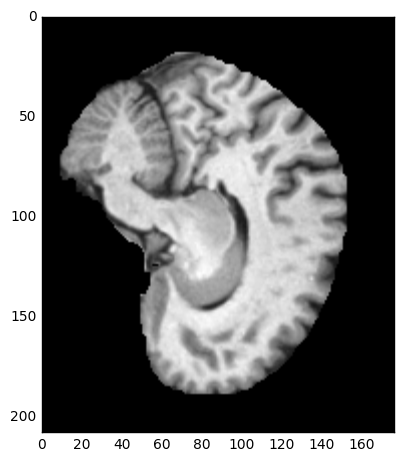

 male, health 


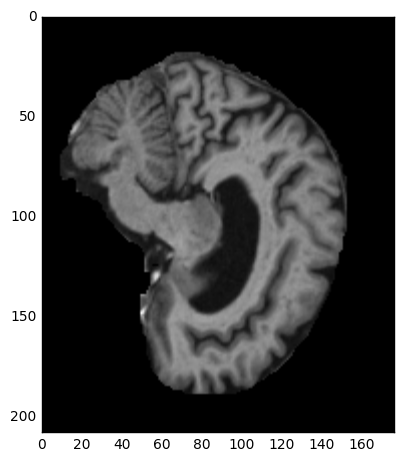

 female, sick 


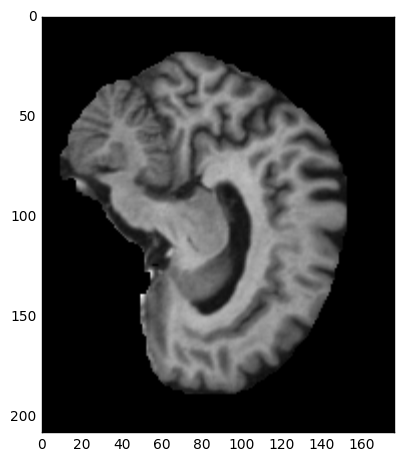

 male, sick 


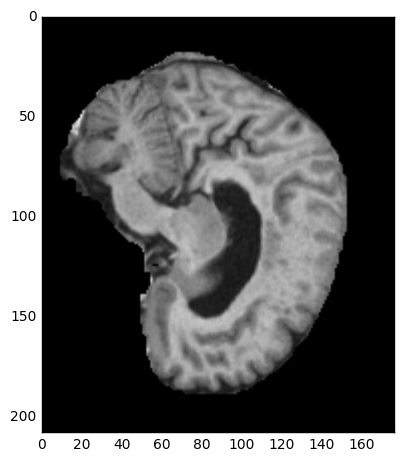

 male, health 


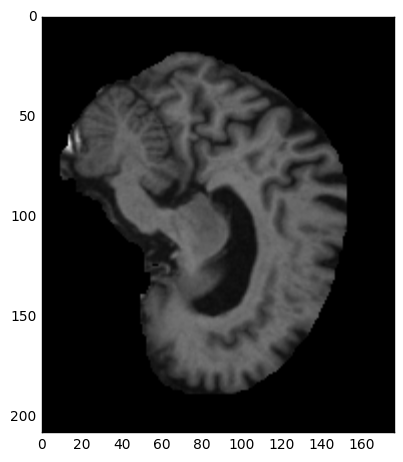

 female, health 


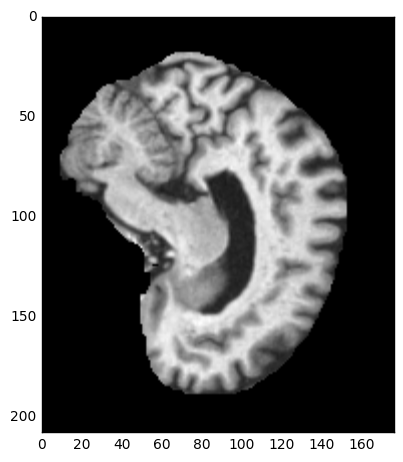

 female, health 


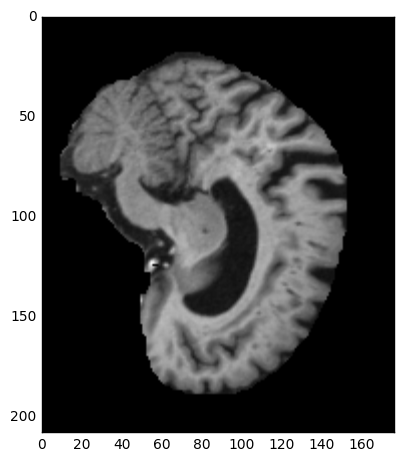

 female, health 


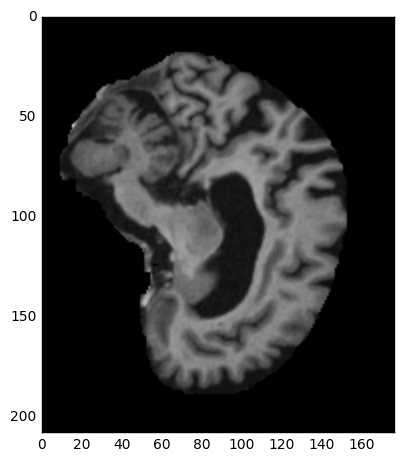

 male, health 


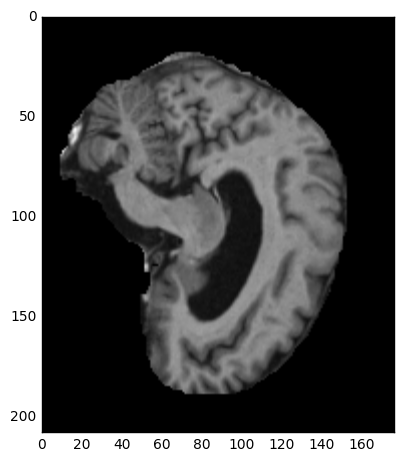

 female, health 


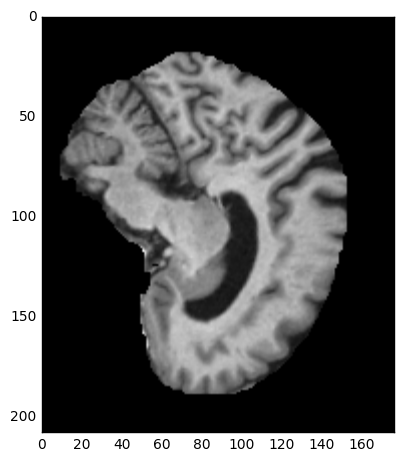

 male, health 


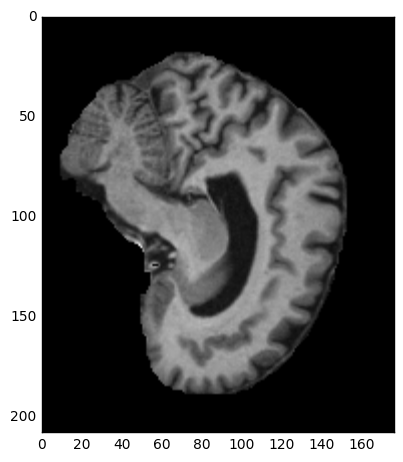

 male, health 


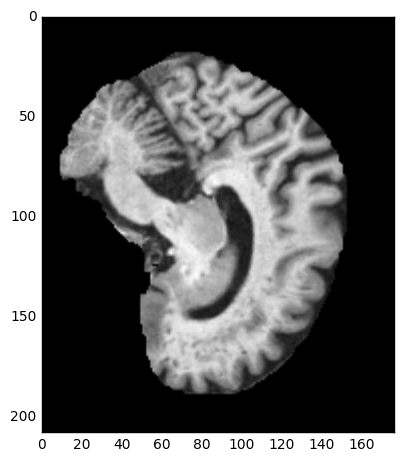

 male, sick 


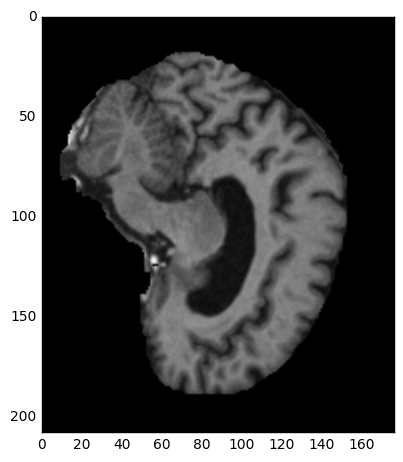

 male, sick 


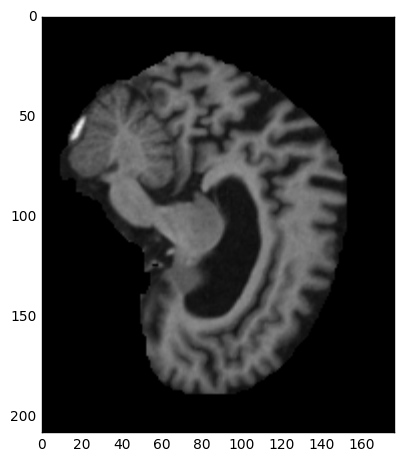

 female, sick 


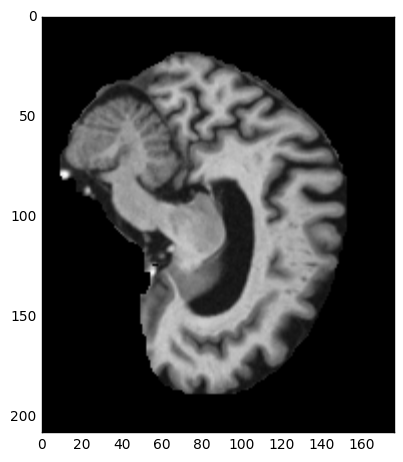

 female, sick 


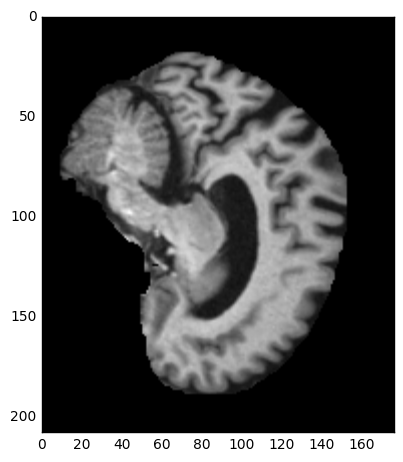

 male, sick 


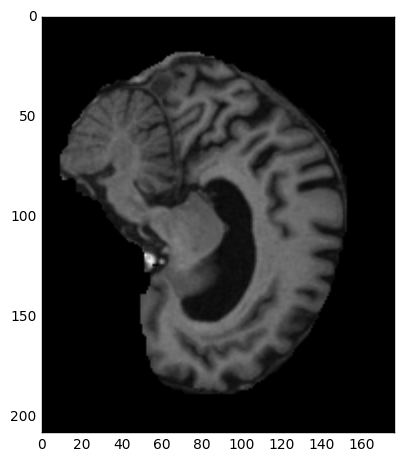

 female, sick 


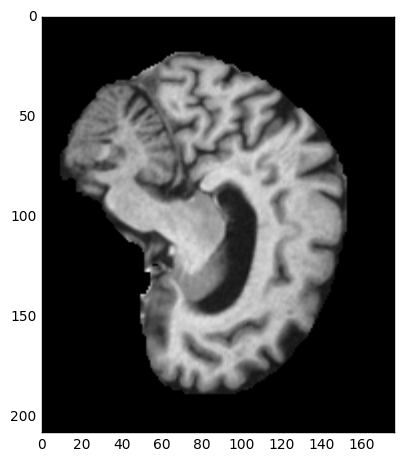

 female, health 


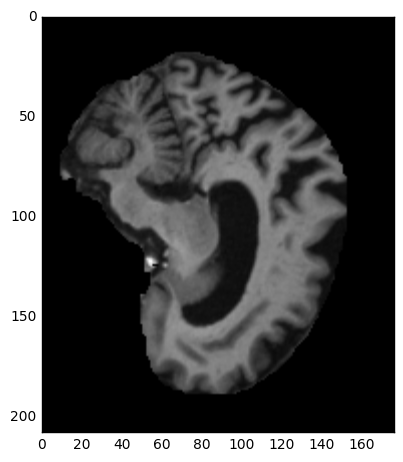

 female, health 


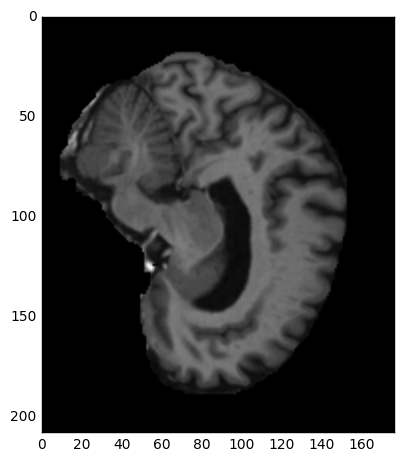

 female, health 


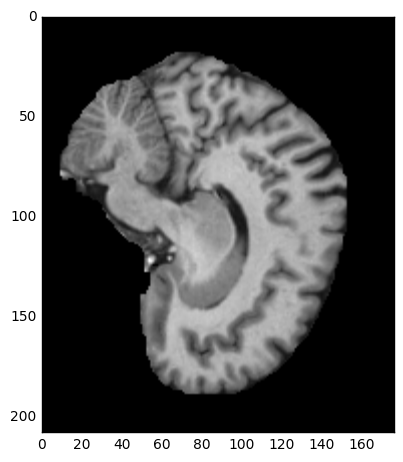

 female, health 


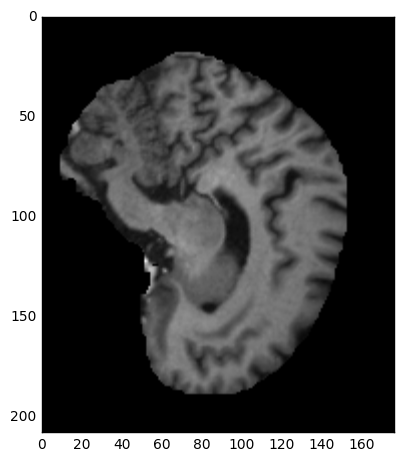

 female, sick 


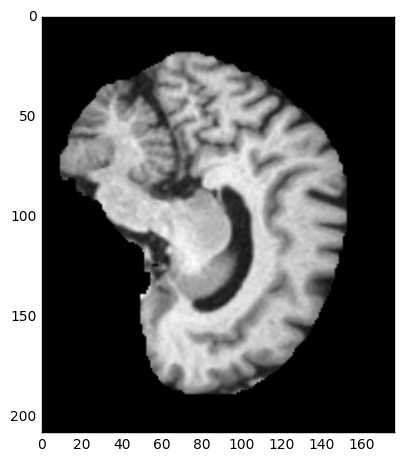

 male, sick 


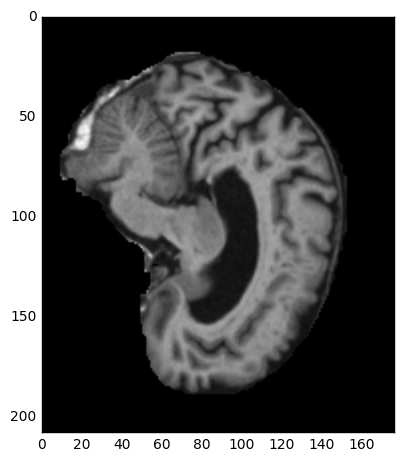

 female, sick 


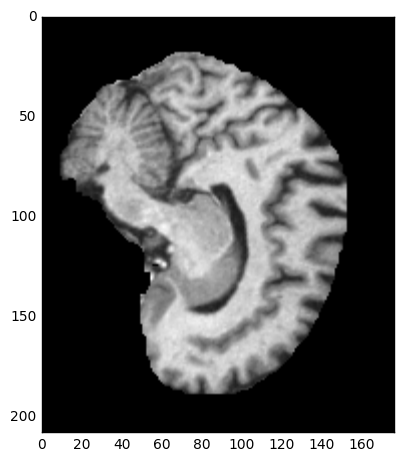

 female, health 


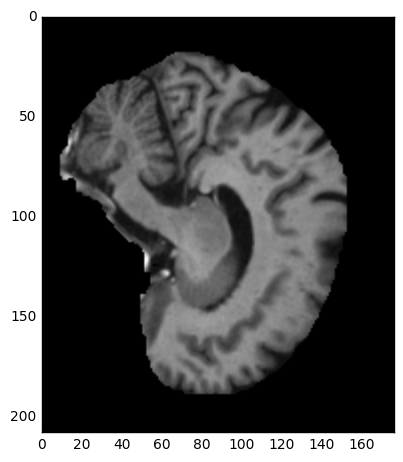

 female, sick 


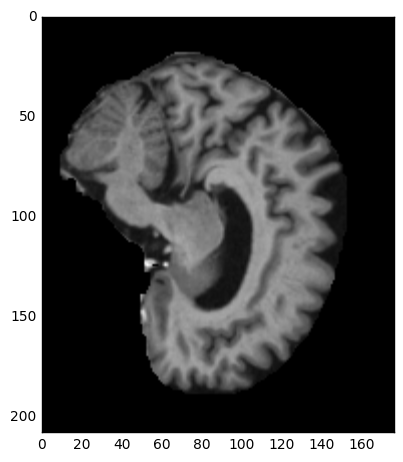

 female, sick 


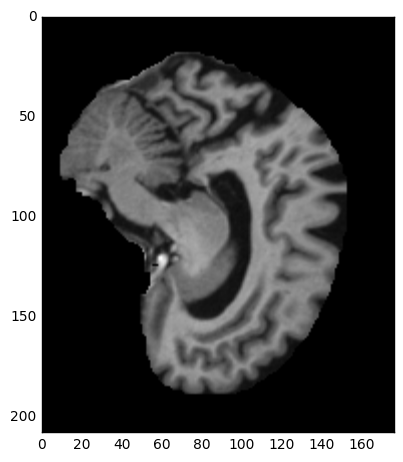

 female, health 


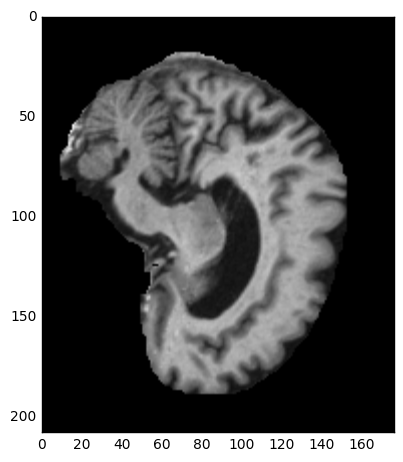

 female, sick 


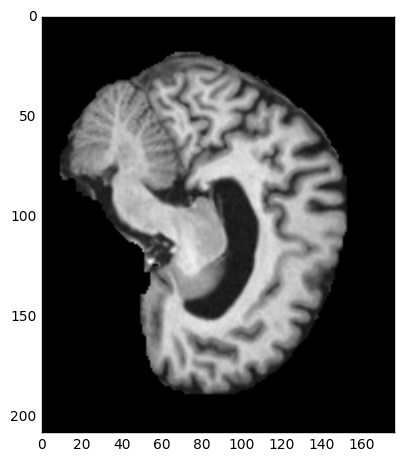

 male, health 


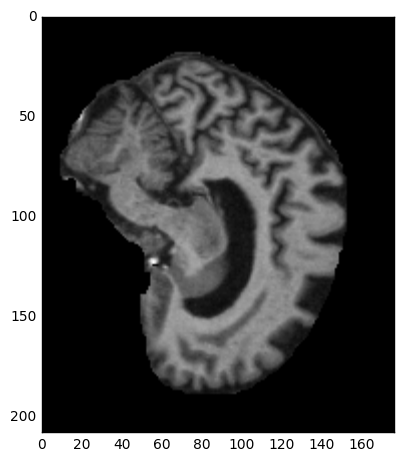

 female, health 


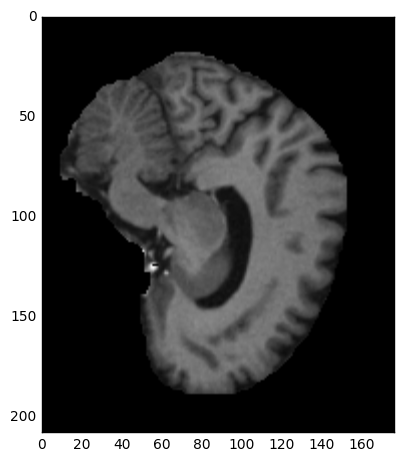

 female, health 


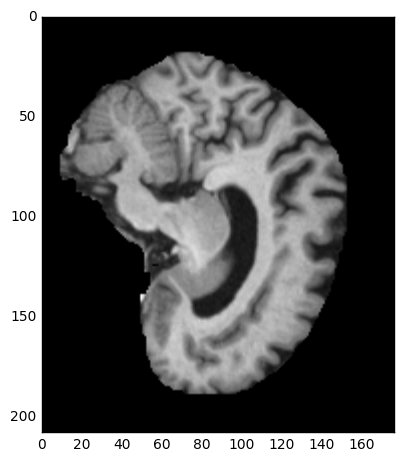

 male, sick 


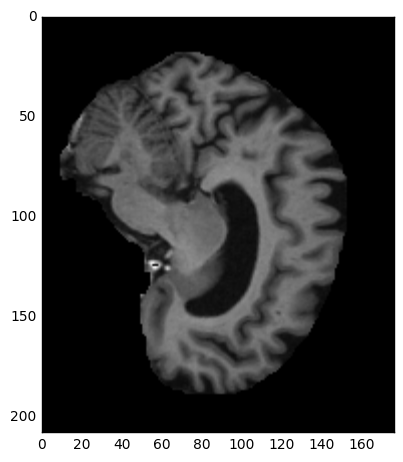

 male, sick 


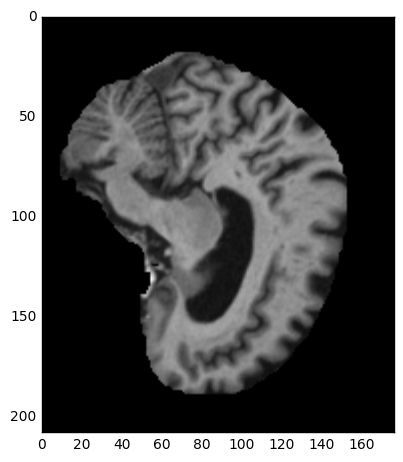

 female, sick 


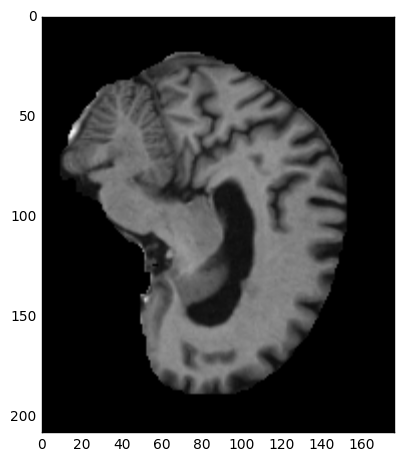

 male, sick 


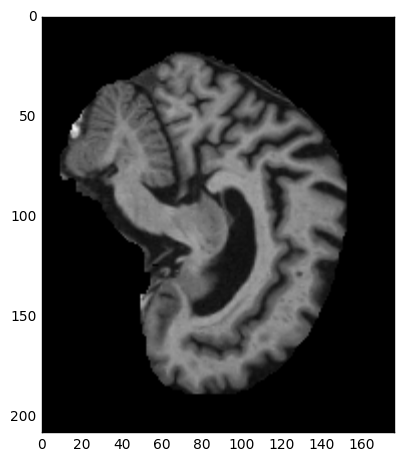

 male, health 


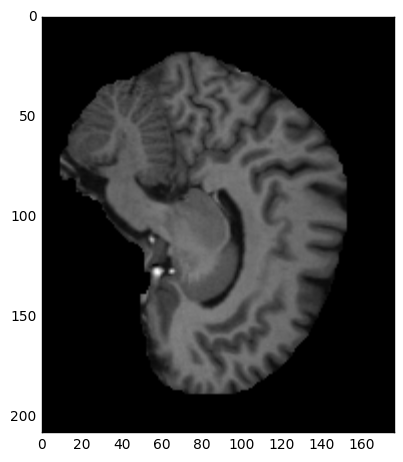

 female, sick 


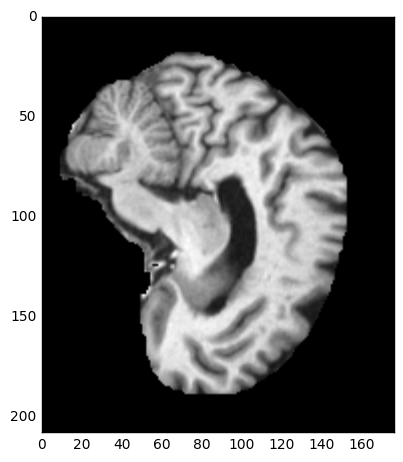

 male, sick 


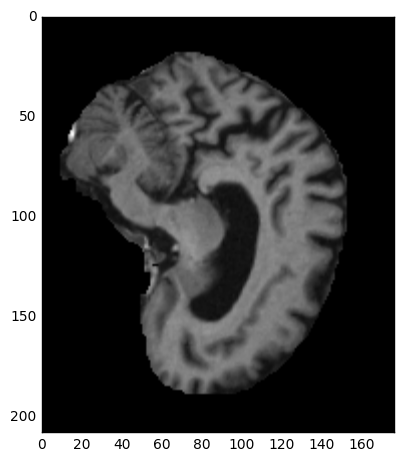

 female, health 


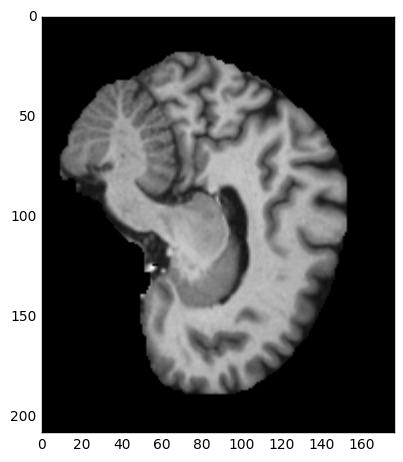

 male, sick 


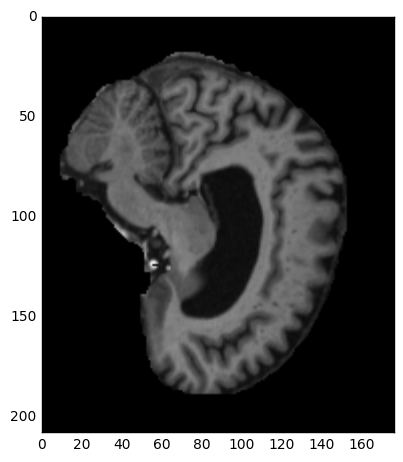

 female, sick 


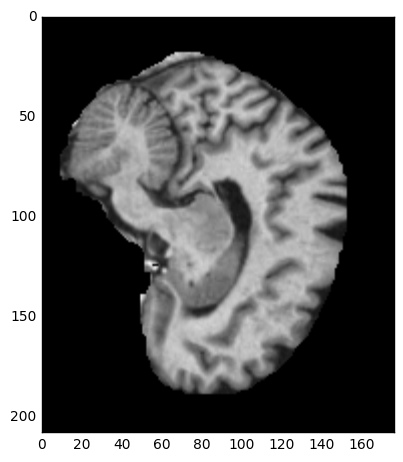

 male, sick 


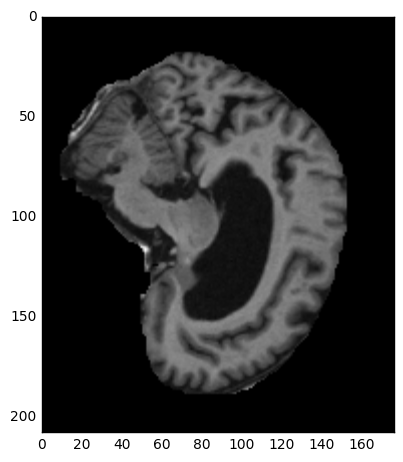

 female, health 


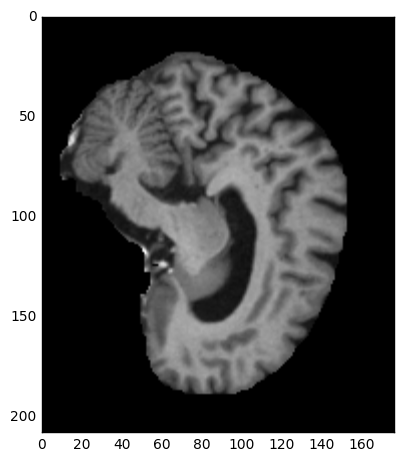

 male, sick 


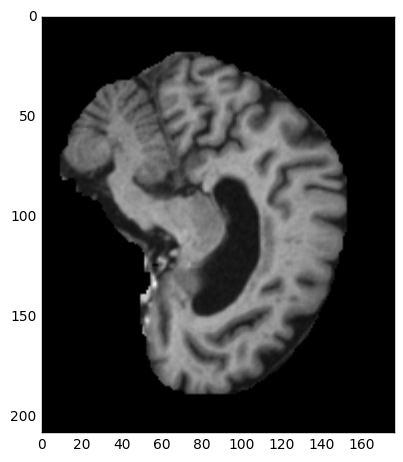

 female, health 


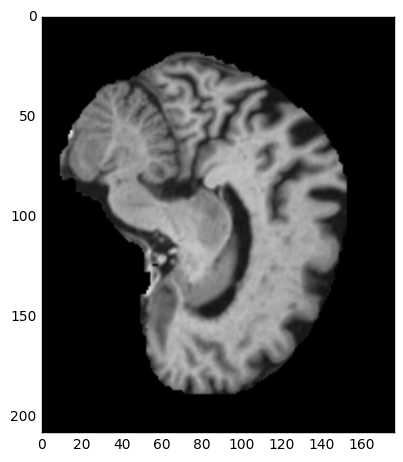

 male, health 


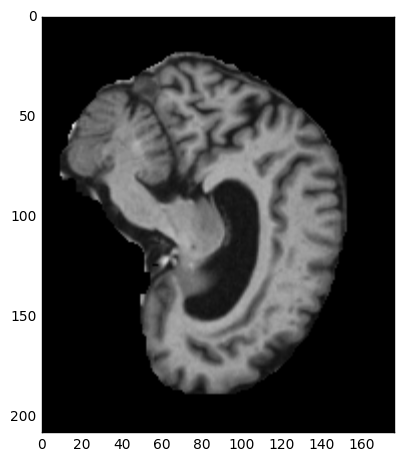

 male, sick 


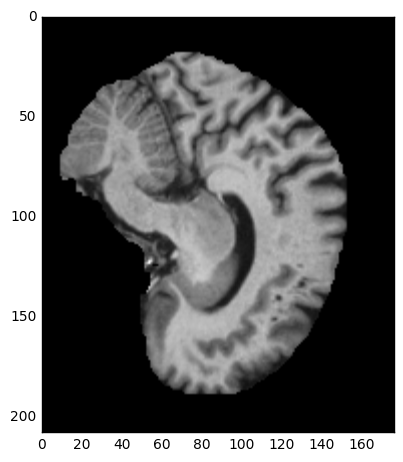

 male, sick 


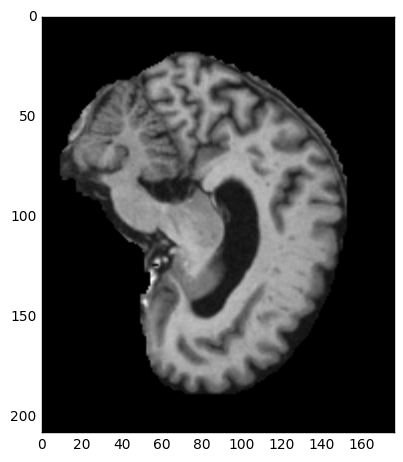

 male, health 


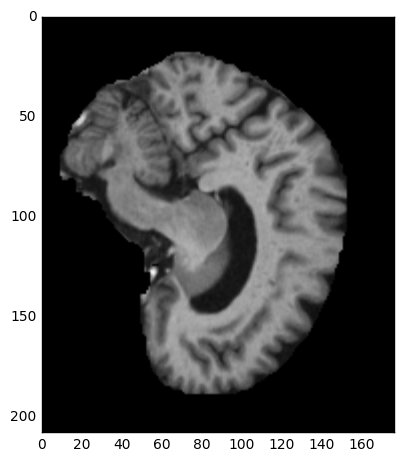

 male, sick 


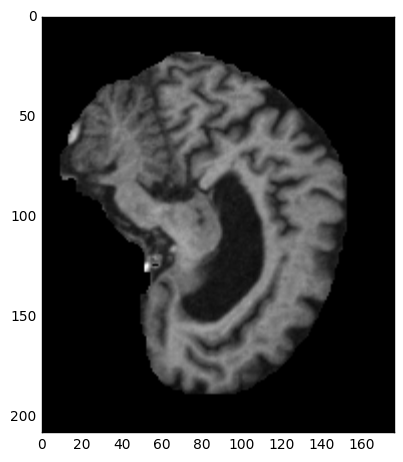

 male, sick 


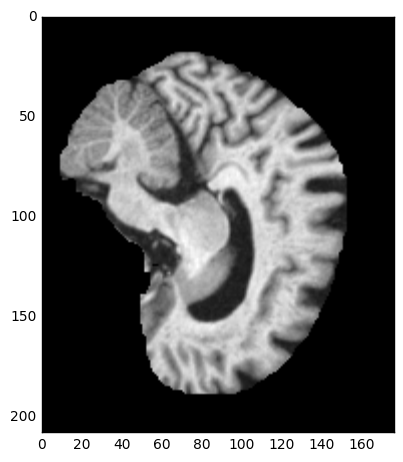

 female, health 


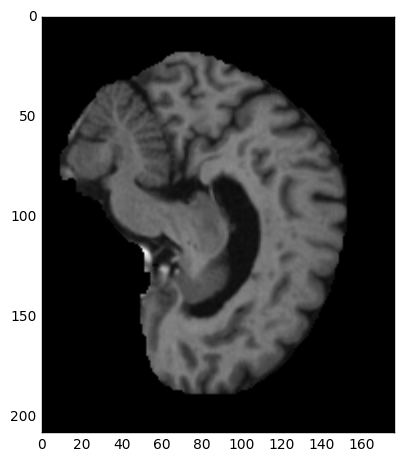

 male, sick 


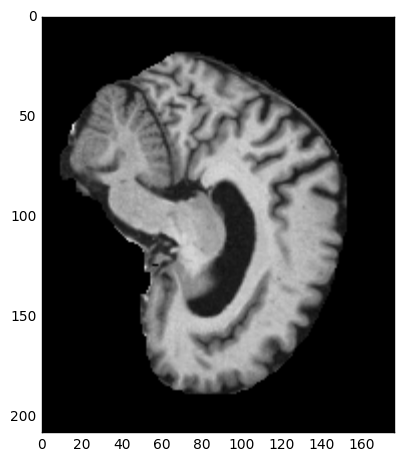

 female, health 


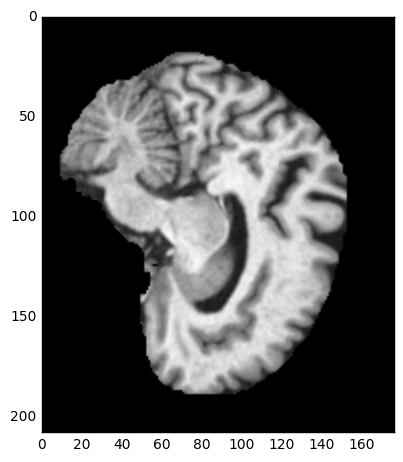

 female, sick 


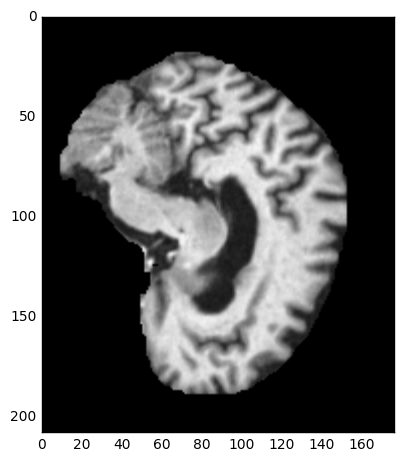

 male, sick 


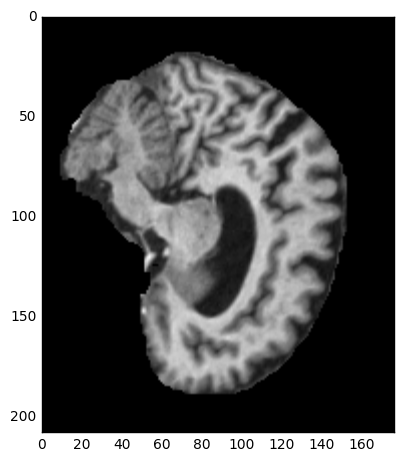

 female, sick 


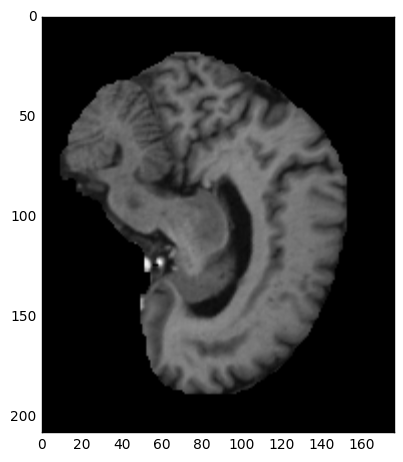

 female, health 


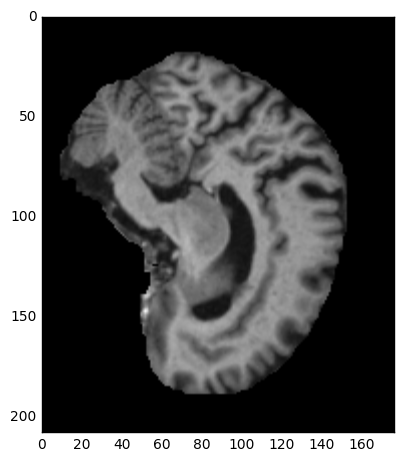

 male, sick 


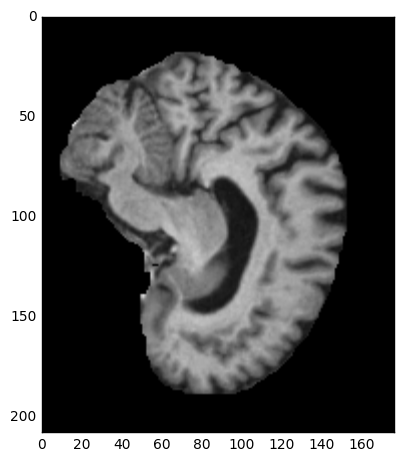

 male, sick 


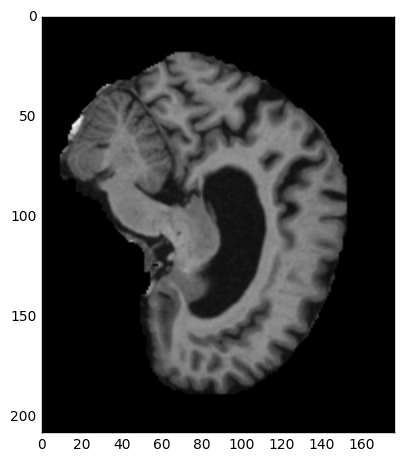

 female, sick 


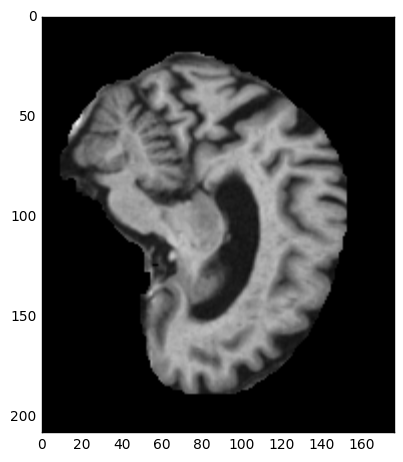

 female, sick 


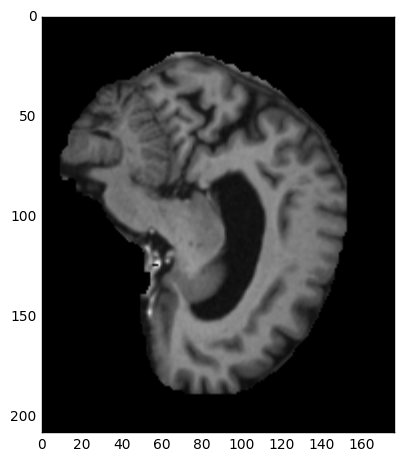

 male, health 


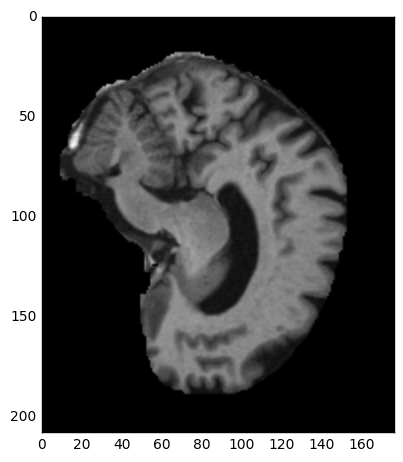

 female, health 


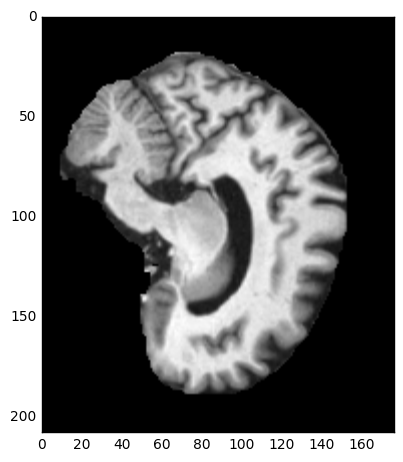

 female, health 


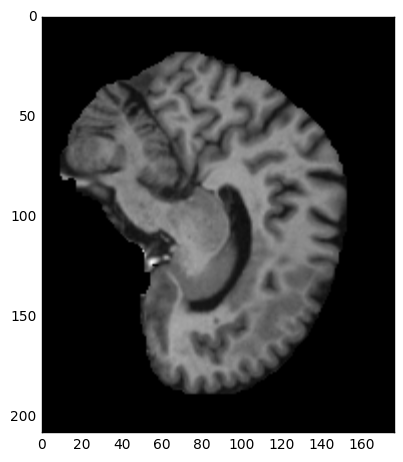

 female, sick 


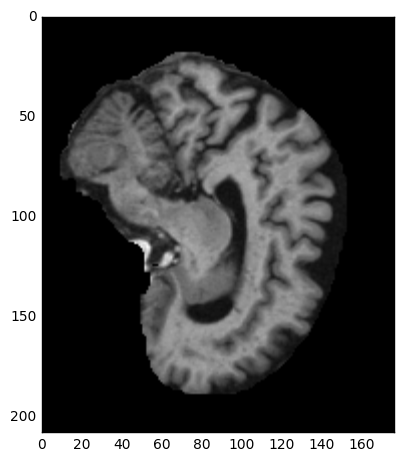

 female, sick 


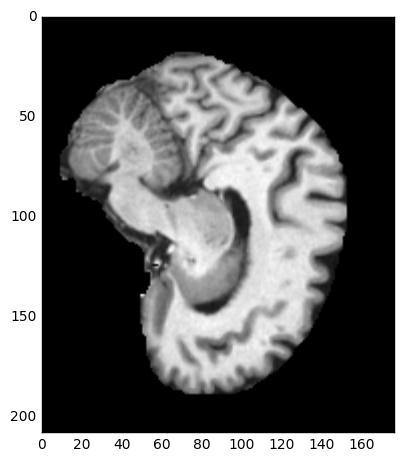

 female, health 


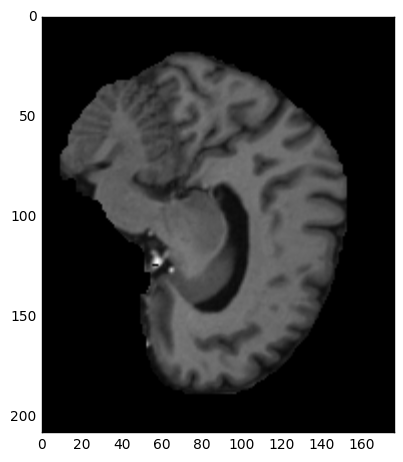

 female, sick 


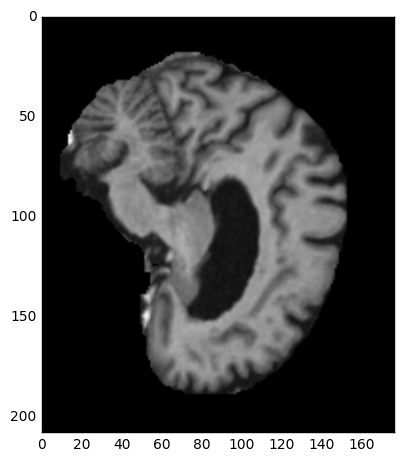

 male, health 


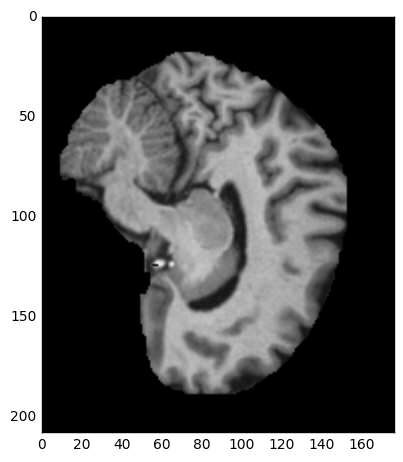

 female, sick 


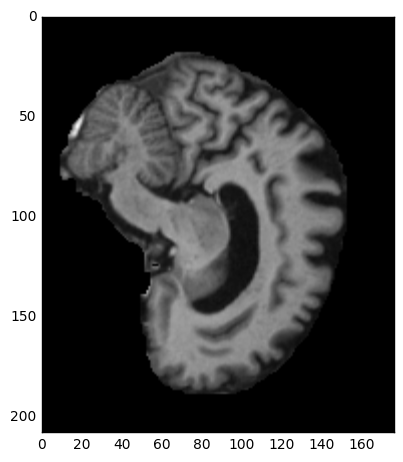

 male, sick 


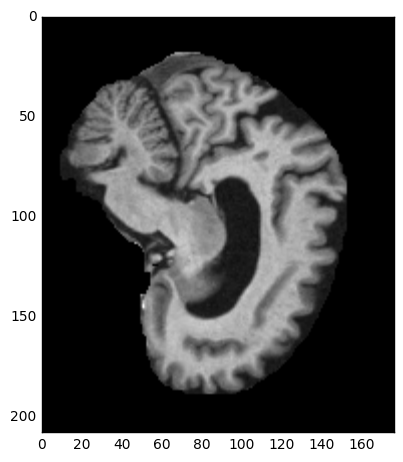

 female, sick 


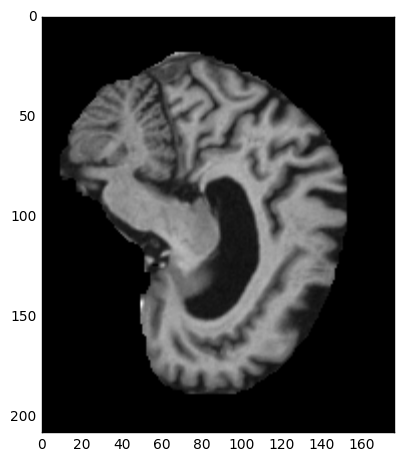

 female, sick 


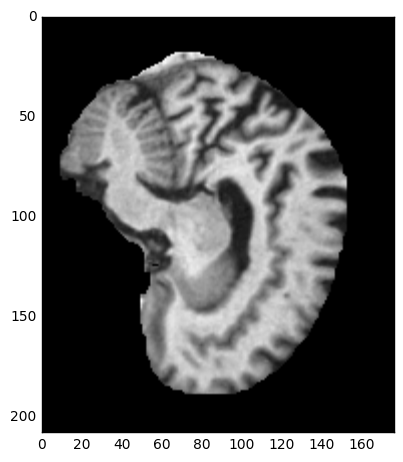

 male, health 


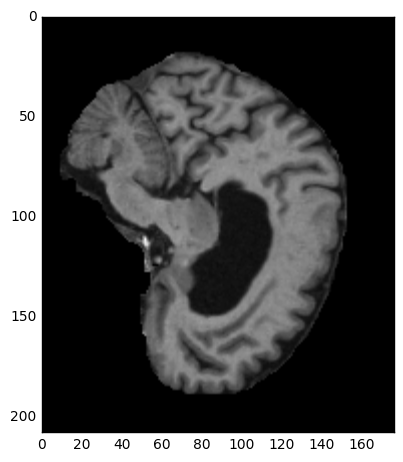

 female, health 


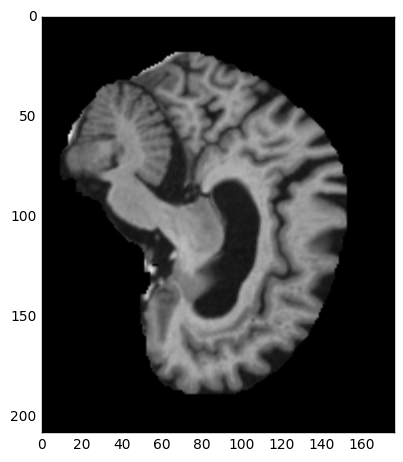

 female, health 


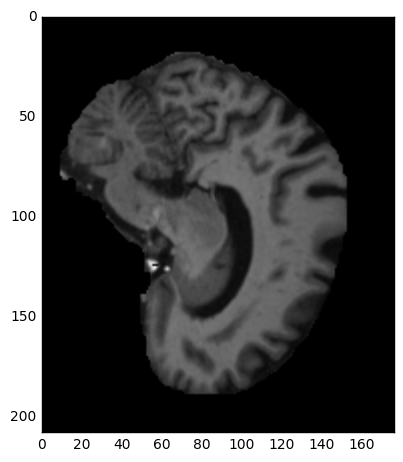

 male, health 


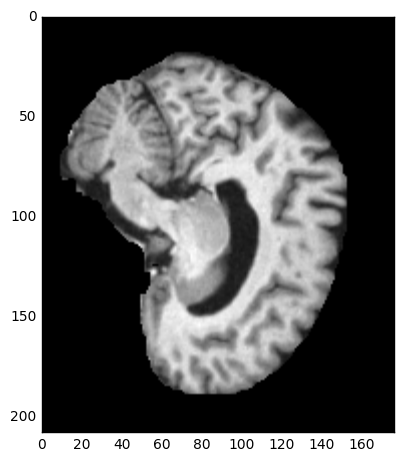

 female, health 


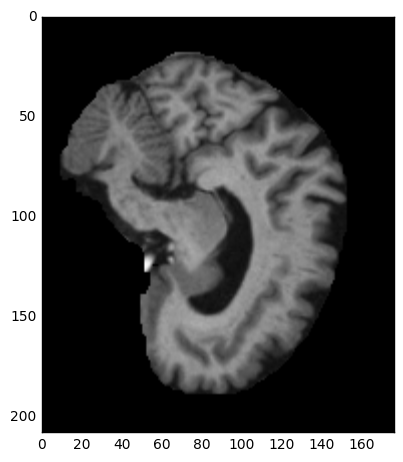

 female, health 


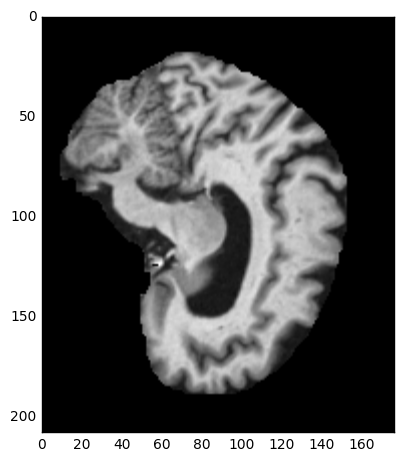

 female, health 


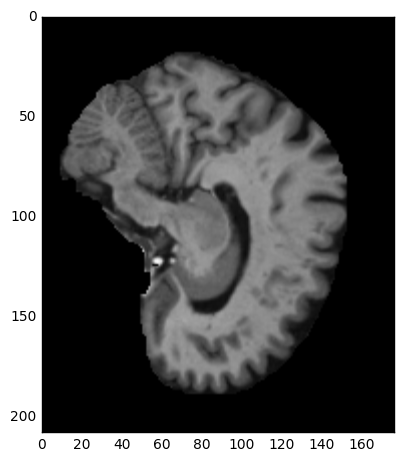

 female, sick 


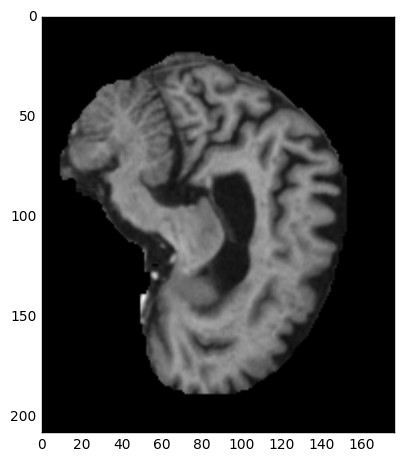

 male, sick 


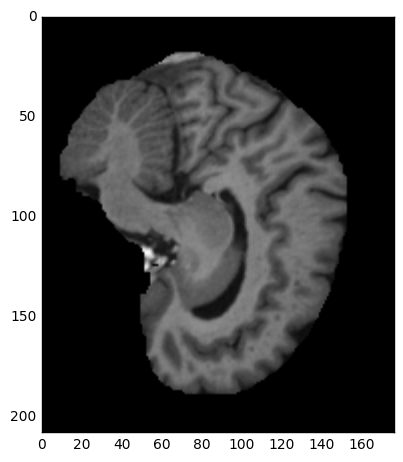

 female, health 


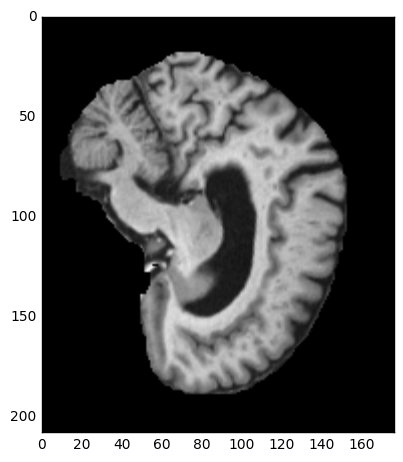

 female, health 


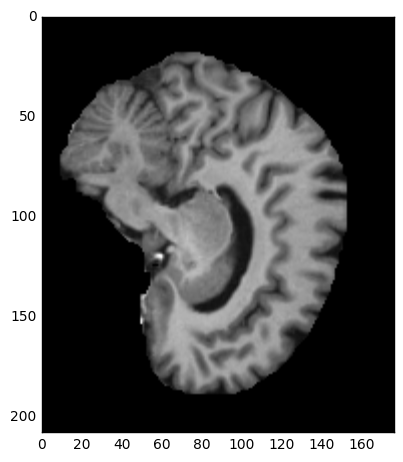

 female, sick 


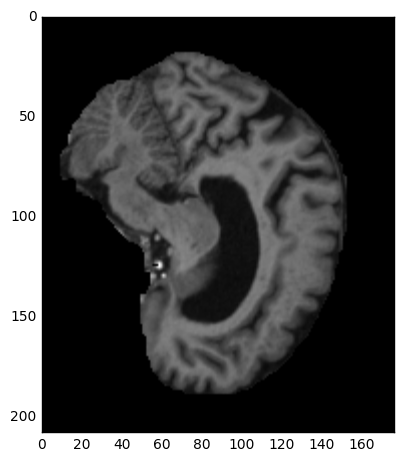

 female, health 


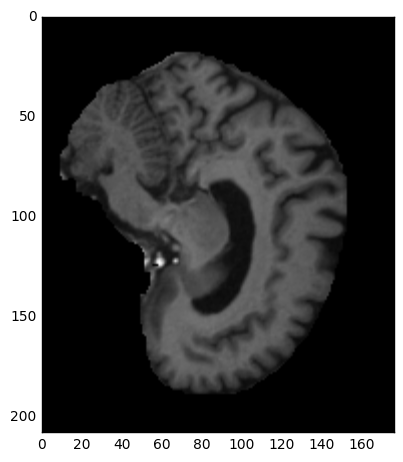

 female, sick 


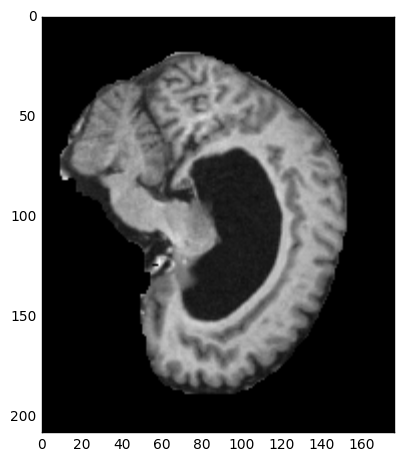

 female, sick 


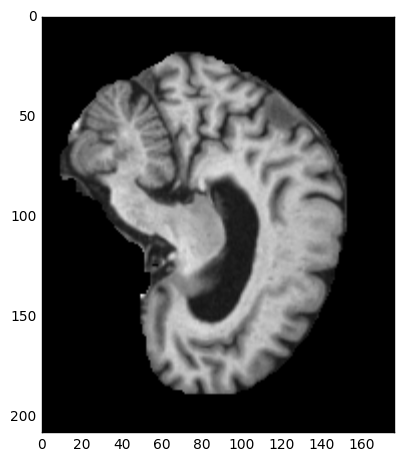

 female, health 


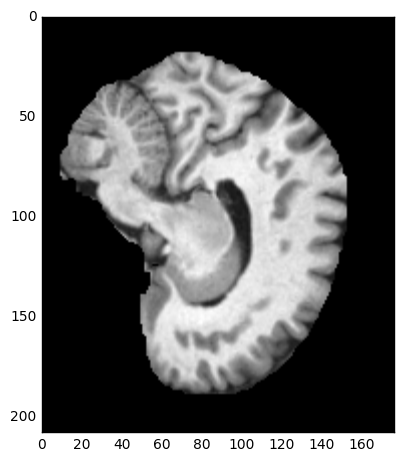

 female, health 


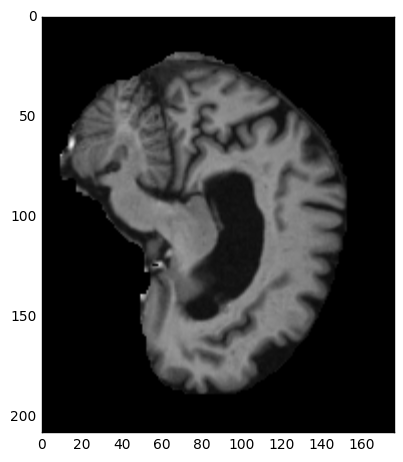

 female, sick 


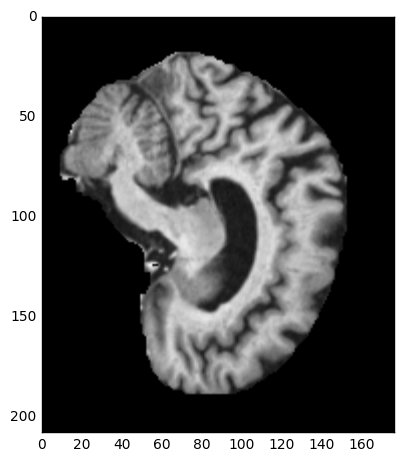

 female, health 


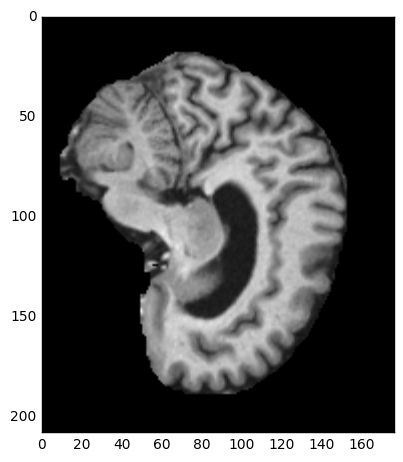

 female, sick 


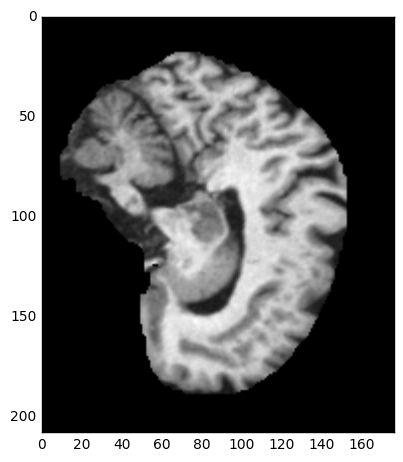

 female, health 


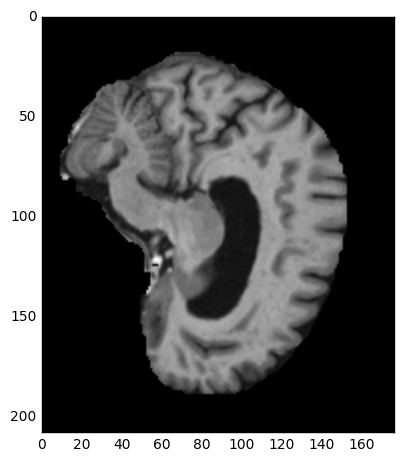

 female, health 


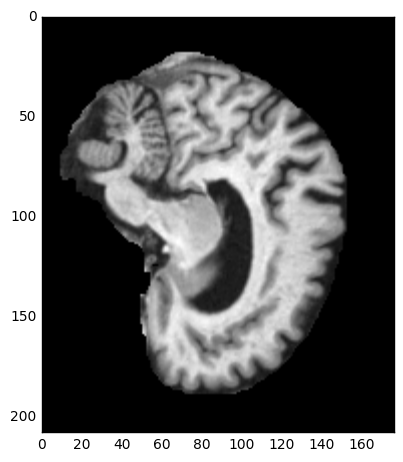

 male, health 


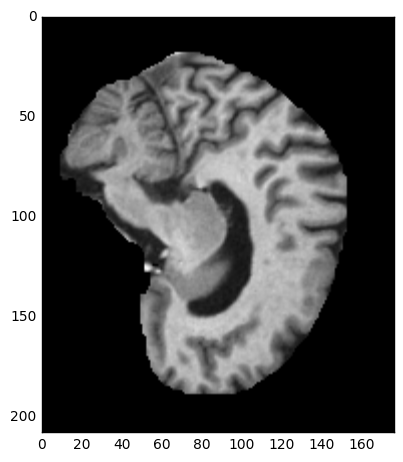

 female, sick 


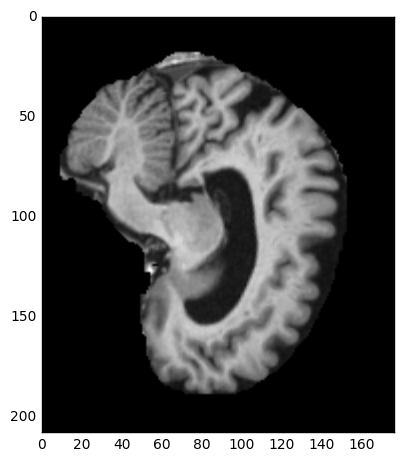

 female, sick 


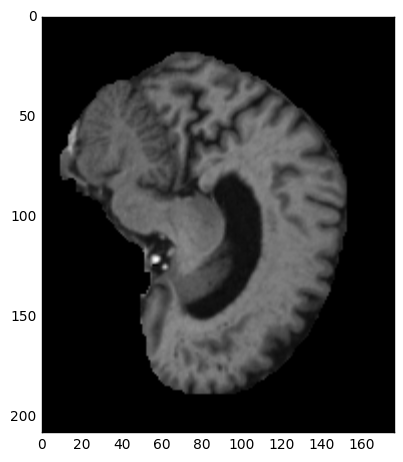

 female, health 


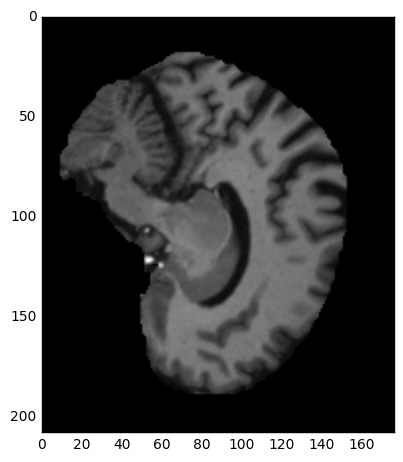

 female, health 


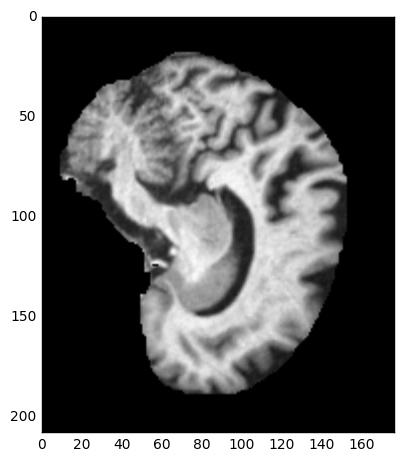

 female, health 


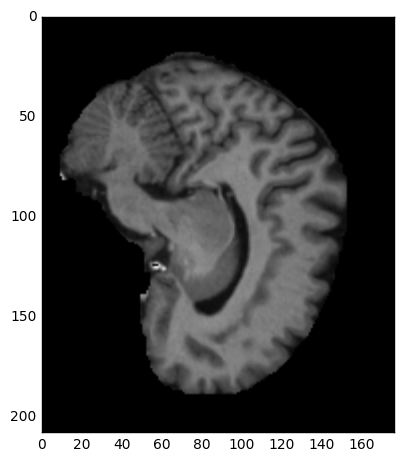

 female, health 


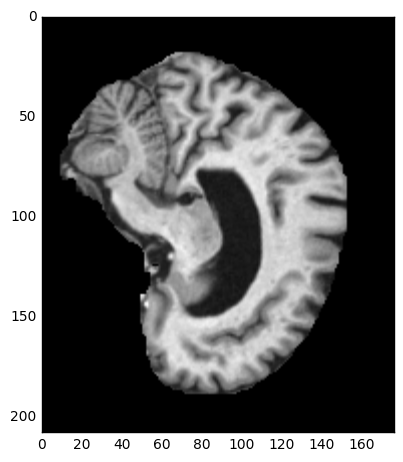

 female, sick 


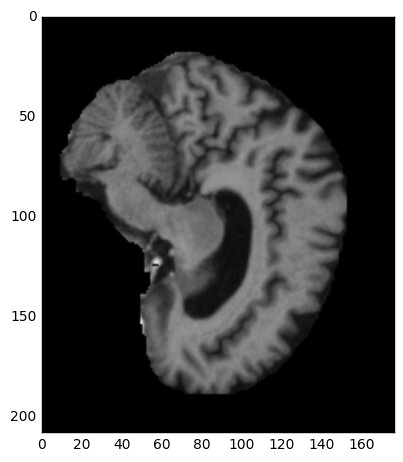

 female, health 


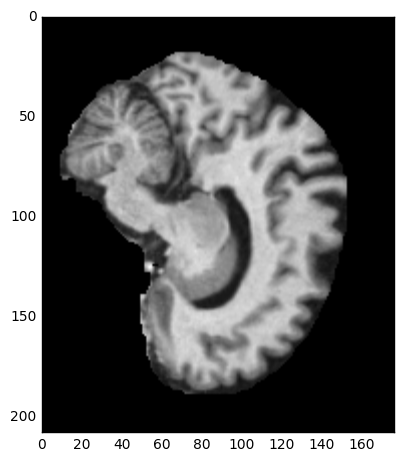

 male, sick 


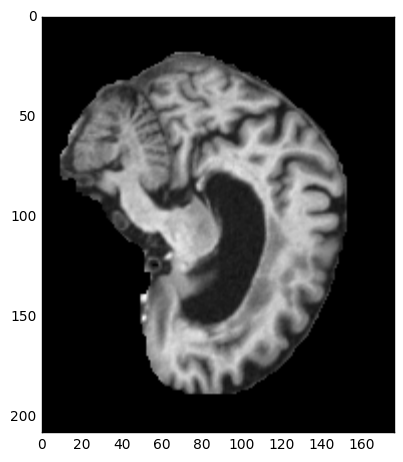

 female, sick 


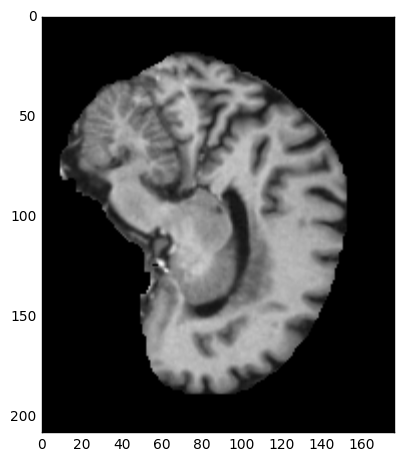

 female, health 


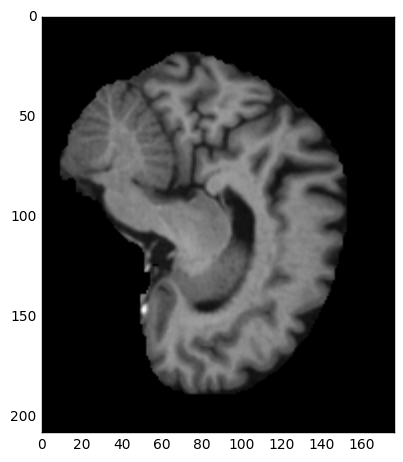

 male, health 


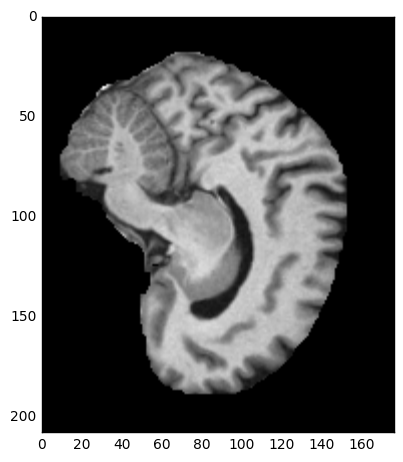

 female, health 


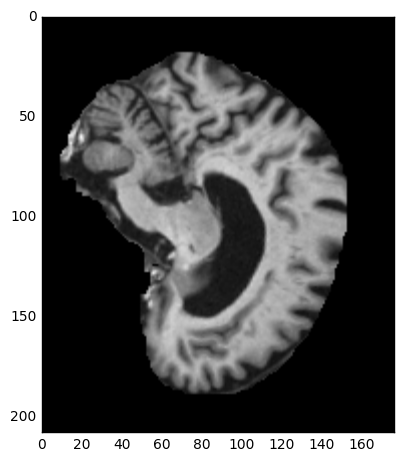

 male, health 


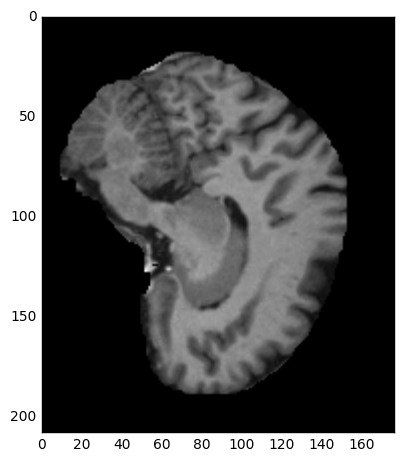

 male, sick 


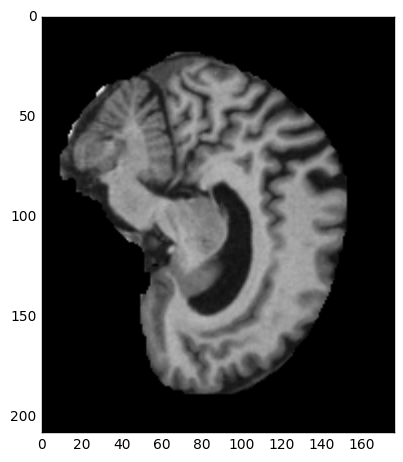

 female, health 


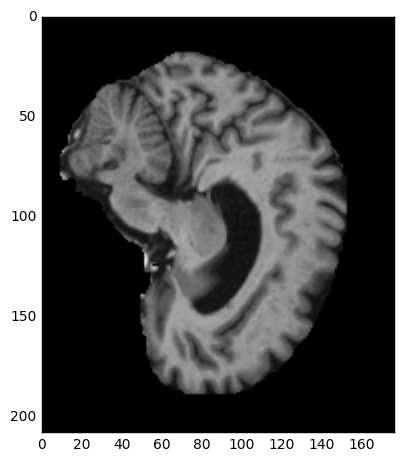

 male, sick 


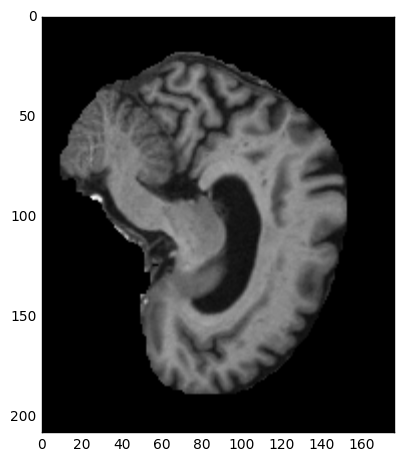

 male, health 


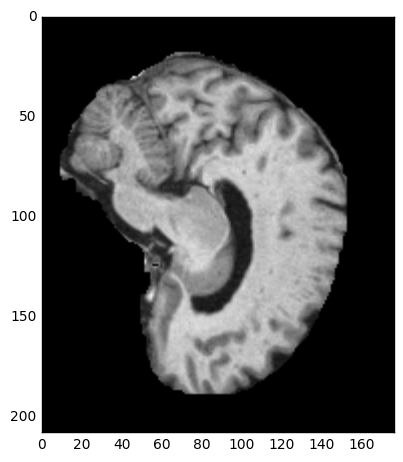

 female, health 


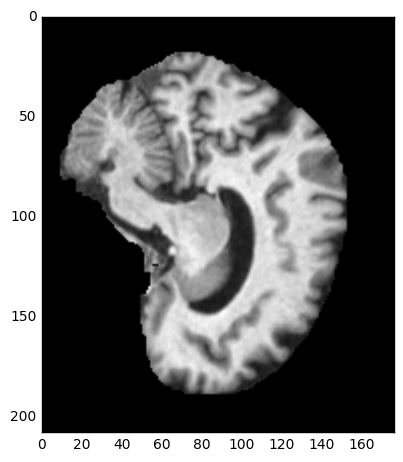

 female, sick 


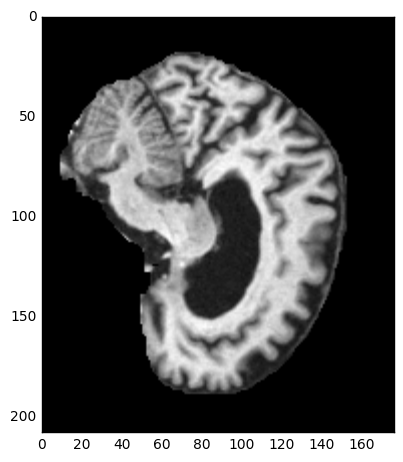

 female, health 


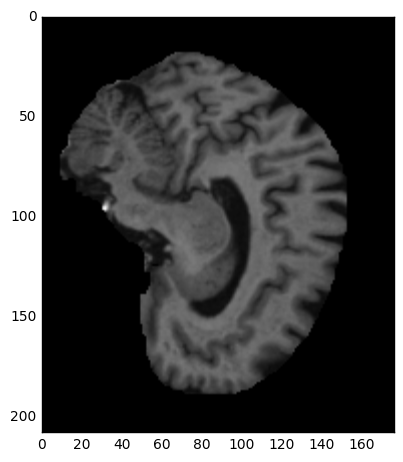

 female, health 


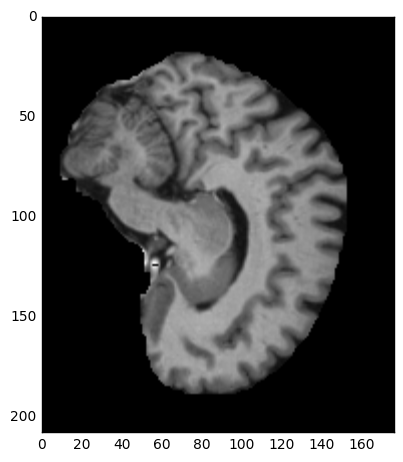

 female, sick 


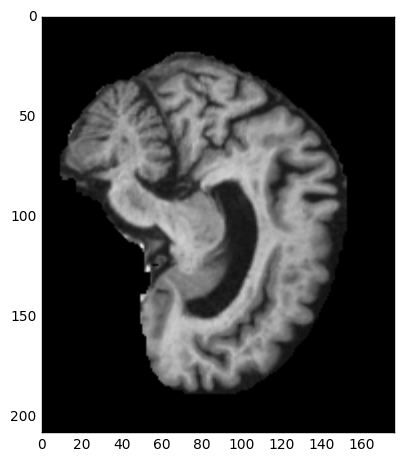

 male, sick 


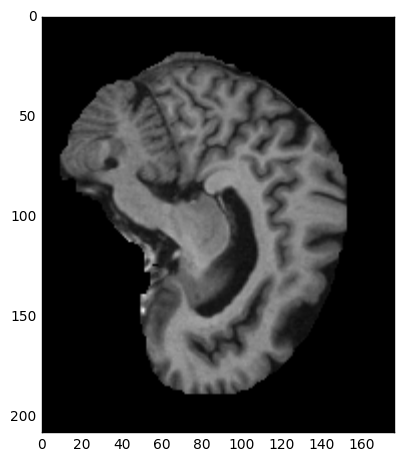

 male, sick 


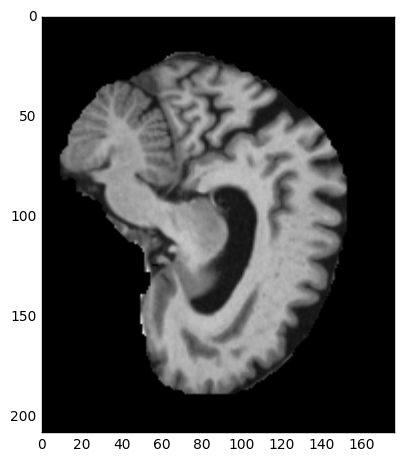

 female, sick 


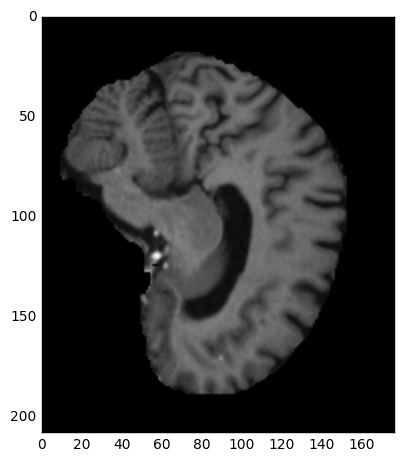

 female, health 


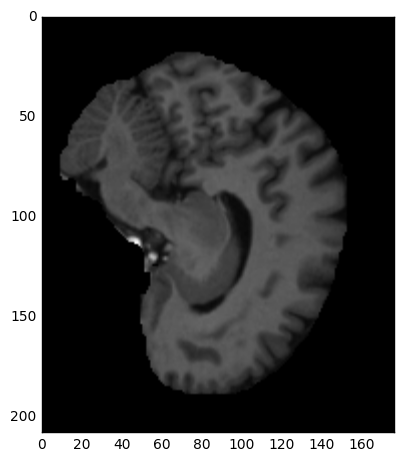

 male, health 


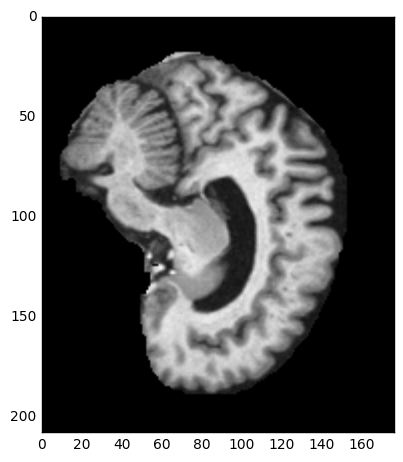

 female, sick 


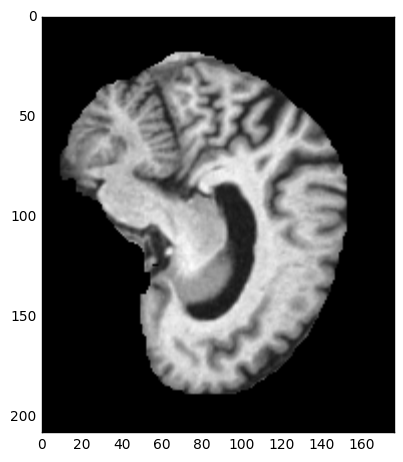

 male, sick 


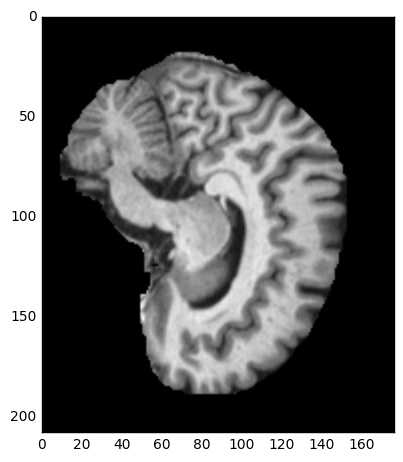

 female, sick 


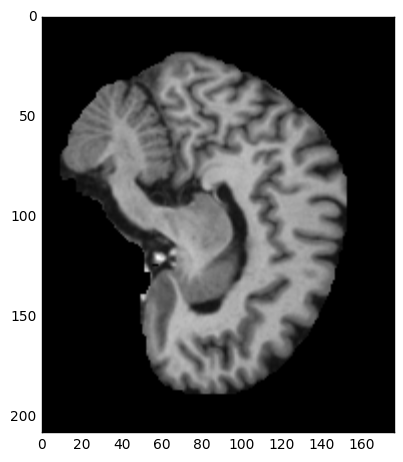

 female, sick 


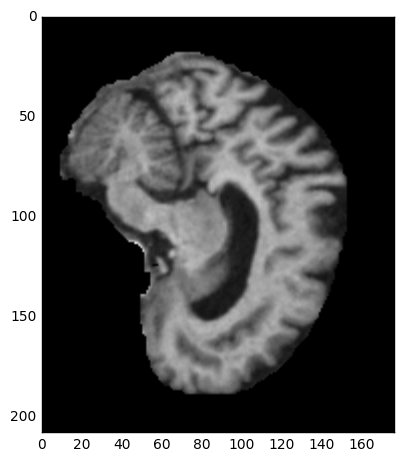

 female, health 


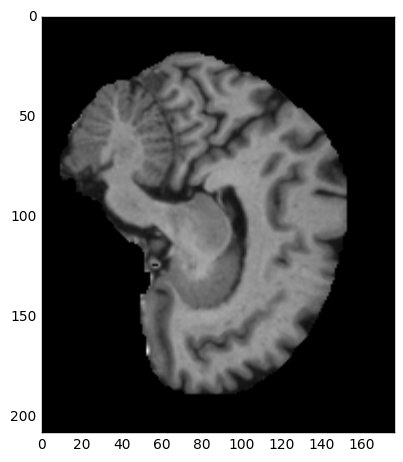

 female, sick 


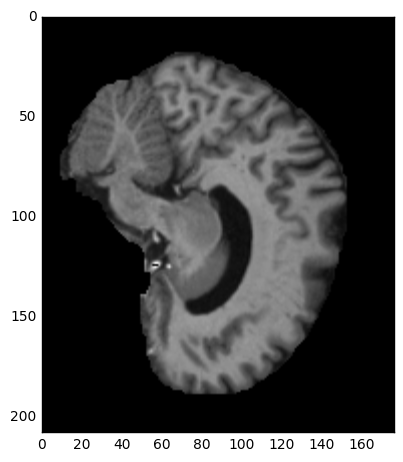

74731

In [28]:
from os.path import isfile, join
import os
import numpy as np
import gc
import SimpleITK
import nibabel as nib
import matplotlib.pyplot as plt

# help function for visulazing
def sitk_show(img, title=None, margin=0.05, dpi=40 ):
    nda = SimpleITK.GetArrayFromImage(img)
    spacing = img.GetSpacing()
    figsize = (1 + margin) * nda.shape[0] / dpi, (1 + margin) * nda.shape[1] / dpi
    extent = (0, nda.shape[1]*spacing[1], nda.shape[0]*spacing[0], 0)
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = fig.add_axes([margin, margin, 1 - 2*margin, 1 - 2*margin])

    plt.set_cmap("gray")
    ax.imshow(nda,extent=extent,interpolation=None)
    
    if title:
        plt.title(title)
    
    plt.show()

pathData = '/home/igor/ML/data_3/set_train/'
onlyfiles = [f for f in os.listdir(pathData) if isfile(join(pathData, f)) and f.endswith('.nii')]
print 'size onlyfiles: ', len(onlyfiles)

targets_file = join('/home/igor/ML/data_3/', 'targets.csv')
targets = [(8,8,8)]
with open(targets_file, 'rb') as csvfile:
    for line in csvfile:
        values = line.split(',')
        targets.append(tuple([int(values[0]), int(values[1]), int(values[2]) ]))


mapped_targets = range(len(targets))
map_to_class = {(0,0,0):0, (0,0,1):1, (0,1,0):2, (0,1,1):3,
                (1,0,0):4, (1,0,1):5, (1,1,0):6, (1,1,1):7, (8,8,8):888 }

for i, item in enumerate(targets):
    mapped_targets[i] = map_to_class[item]


idxSlice = 75
for f in onlyfiles:
    full_f = join(pathData, f)
    pic_id = int(f.split('_')[1].split('.')[0])
    if mapped_targets[pic_id] % 4 >= 2: # young 
        continue
    if mapped_targets[pic_id] == 1:
        print ' male, health '
    if mapped_targets[pic_id] == 5:
        print ' female, health '
        
    if mapped_targets[pic_id] == 0:
        print ' male, sick '
    if mapped_targets[pic_id] == 4:
        print ' female, sick '
    
    
    ndImg = nib.load(full_f).get_data()
    ndImg = np.sum(ndImg, axis=3)       # sum upon the 4th axis so that we reduce the img to 3d

    itkImg = SimpleITK.GetImageFromArray(ndImg)
    
    
    visImg = itkImg[:,:,idxSlice]
    sitk_show(visImg)
    
gc.collect()    